In [2]:
# NAME: David Mmaduabuchi OKPAGA
# DOSSIER: 22313043 
# COURSE: Data Mining Project 2023
# DATASET: Wisconsin Breast Cancer (WBC)
# DATE: 22/12/2023

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.datasets import load_breast_cancer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
%matplotlib inline
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
pd.set_option('display.max_columns', None)

# Data Preprocessing

In [3]:
data_df = pd.read_csv("wdbc.data")
data_df.head()

,842302,M,17.99,10.38,122.8,1001,0.1184,0.2776,0.3001,0.1471,0.2419,0.07871,1.095,0.9053,8.589,153.4,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.6,2019,0.1622,0.6656,0.7119,0.2654,0.4601,0.1189
0,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
1,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
2,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
3,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678
4,843786,M,12.45,15.70,82.57,477.1,0.12780,0.17000,0.1578,0.08089,0.2087,0.07613,0.3345,0.8902,2.217,27.19,0.007510,0.03345,0.03672,0.01137,0.02165,0.005082,15.47,23.75,103.40,741.6,0.1791,0.5249,0.5355,0.1741,0.3985,0.12440


In [4]:
data_df = pd.read_csv('wdbc.data', sep = ',', names=['ID', 'Diagnosis', 'Radius_mean', 'Texture_mean', 'Perimeter_mean', 'Area_mean', 'Smoothness_mean', 'Compactness_mean', 'Concavity_mean', 'Concave points_mean', 'Symmetry_mean', 'Fractal dimension_mean', 'Radius_se', 'Tecture_se', 'Perimeter_se', 'Area_se', 'Smoothness_se', 'Compactness_se', 'Concavity_se', 'Concave points_se', 'Symmetry-se', 'Fractal dimension_se', 'Radius_worst', 'Texture_worst', 'Perimeter_worst', 'Area_worst', 'Smoothness_worst', 'Compactness_worst', 'Concavity_worst', 'Concave points_worst', 'Symmetry_worst', 'Fractal_dimension_worst'])
data_df.head()

,ID,Diagnosis,Radius_mean,Texture_mean,Perimeter_mean,Area_mean,Smoothness_mean,Compactness_mean,Concavity_mean,Concave points_mean,Symmetry_mean,Fractal dimension_mean,Radius_se,Tecture_se,Perimeter_se,Area_se,Smoothness_se,Compactness_se,Concavity_se,Concave points_se,Symmetry-se,Fractal dimension_se,Radius_worst,Texture_worst,Perimeter_worst,Area_worst,Smoothness_worst,Compactness_worst,Concavity_worst,Concave points_worst,Symmetry_worst,Fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [5]:
#data_dropped = data_df.drop("Diagnosis",axis=1
data_dropped = data_df.drop("ID",axis=1)

In [6]:
data_dropped

,Diagnosis,Radius_mean,Texture_mean,Perimeter_mean,Area_mean,Smoothness_mean,Compactness_mean,Concavity_mean,Concave points_mean,Symmetry_mean,Fractal dimension_mean,Radius_se,Tecture_se,Perimeter_se,Area_se,Smoothness_se,Compactness_se,Concavity_se,Concave points_se,Symmetry-se,Fractal dimension_se,Radius_worst,Texture_worst,Perimeter_worst,Area_worst,Smoothness_worst,Compactness_worst,Concavity_worst,Concave points_worst,Symmetry_worst,Fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,1.1760,1.2560,7.673,158.70,0.010300,0.02891,0.05198,0.02454,0.01114,0.004239,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,0.7655,2.4630,5.203,99.04,0.005769,0.02423,0.03950,0.01678,0.01898,0.002498,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,0.4564,1.0750,3.425,48.55,0.005903,0.03731,0.04730,0.01557,0.01318,0.003892,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,0.7260,1.5950,5.772,86.22,0.006522,0.06158,0.07117,0.01664,0.02324,0.006185,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [7]:
data_df1 = data_df.copy()
data_dropped1 = data_dropped.drop("Diagnosis",axis=1)
data_dropped1

,Radius_mean,Texture_mean,Perimeter_mean,Area_mean,Smoothness_mean,Compactness_mean,Concavity_mean,Concave points_mean,Symmetry_mean,Fractal dimension_mean,Radius_se,Tecture_se,Perimeter_se,Area_se,Smoothness_se,Compactness_se,Concavity_se,Concave points_se,Symmetry-se,Fractal dimension_se,Radius_worst,Texture_worst,Perimeter_worst,Area_worst,Smoothness_worst,Compactness_worst,Concavity_worst,Concave points_worst,Symmetry_worst,Fractal_dimension_worst
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,1.1760,1.2560,7.673,158.70,0.010300,0.02891,0.05198,0.02454,0.01114,0.004239,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,0.7655,2.4630,5.203,99.04,0.005769,0.02423,0.03950,0.01678,0.01898,0.002498,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,0.4564,1.0750,3.425,48.55,0.005903,0.03731,0.04730,0.01557,0.01318,0.003892,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,0.7260,1.5950,5.772,86.22,0.006522,0.06158,0.07117,0.01664,0.02324,0.006185,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


# Descriptive Statistics

In [8]:
data_dropped1.describe().T

,count,mean,std,min,25%,50%,75%,max
Radius_mean,569.0,14.127292,3.524049,6.981000,11.700000,13.370000,15.780000,28.11000
Texture_mean,569.0,19.289649,4.301036,9.710000,16.170000,18.840000,21.800000,39.28000
Perimeter_mean,569.0,91.969033,24.298981,43.790000,75.170000,86.240000,104.100000,188.50000
Area_mean,569.0,654.889104,351.914129,143.500000,420.300000,551.100000,782.700000,2501.00000
Smoothness_mean,569.0,0.096360,0.014064,0.052630,0.086370,0.095870,0.105300,0.16340
Compactness_mean,569.0,0.104341,0.052813,0.019380,0.064920,0.092630,0.130400,0.34540
Concavity_mean,569.0,0.088799,0.079720,0.000000,0.029560,0.061540,0.130700,0.42680
Concave points_mean,569.0,0.048919,0.038803,0.000000,0.020310,0.033500,0.074000,0.20120
Symmetry_mean,569.0,0.181162,0.027414,0.106000,0.161900,0.179200,0.195700,0.30400
Fractal dimension_mean,569.0,0.062798,0.007060,0.049960,0.057700,0.061540,0.066120,0.09744


Descriptive statistics above reveal right-skewness in the radius, texture, and perimeter variables, indicated by higher means than medians. Potential outliers are suggested by comparing third quantile values with maxima. However, a conclusive judgment is best made through boxplot analysis. The dataset displays considerable variation, prompting the need for scaling. In cases of high correlation between variables, PCA should be considered.

In [9]:
data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   ID                       569 non-null    int64  
 1   Diagnosis                569 non-null    object 
 2   Radius_mean              569 non-null    float64
 3   Texture_mean             569 non-null    float64
 4   Perimeter_mean           569 non-null    float64
 5   Area_mean                569 non-null    float64
 6   Smoothness_mean          569 non-null    float64
 7   Compactness_mean         569 non-null    float64
 8   Concavity_mean           569 non-null    float64
 9   Concave points_mean      569 non-null    float64
 10  Symmetry_mean            569 non-null    float64
 11  Fractal dimension_mean   569 non-null    float64
 12  Radius_se                569 non-null    float64
 13  Tecture_se               569 non-null    float64
 14  Perimeter_se             5

In [10]:
data_df.isnull().any()

ID                         False
Diagnosis                  False
Radius_mean                False
Texture_mean               False
Perimeter_mean             False
Area_mean                  False
Smoothness_mean            False
Compactness_mean           False
Concavity_mean             False
Concave points_mean        False
Symmetry_mean              False
Fractal dimension_mean     False
Radius_se                  False
Tecture_se                 False
Perimeter_se               False
Area_se                    False
Smoothness_se              False
Compactness_se             False
Concavity_se               False
Concave points_se          False
Symmetry-se                False
Fractal dimension_se       False
Radius_worst               False
Texture_worst              False
Perimeter_worst            False
Area_worst                 False
Smoothness_worst           False
Compactness_worst          False
Concavity_worst            False
Concave points_worst       False
Symmetry_w

In [11]:
features_mean= list(data_dropped.columns[1:11])
features_se= list(data_dropped.columns[11:20])
features_worst=list(data_dropped.columns[21:31])
data_dropped.columns

Index(['Diagnosis', 'Radius_mean', 'Texture_mean', 'Perimeter_mean',
       'Area_mean', 'Smoothness_mean', 'Compactness_mean', 'Concavity_mean',
       'Concave points_mean', 'Symmetry_mean', 'Fractal dimension_mean',
       'Radius_se', 'Tecture_se', 'Perimeter_se', 'Area_se', 'Smoothness_se',
       'Compactness_se', 'Concavity_se', 'Concave points_se', 'Symmetry-se',
       'Fractal dimension_se', 'Radius_worst', 'Texture_worst',
       'Perimeter_worst', 'Area_worst', 'Smoothness_worst',
       'Compactness_worst', 'Concavity_worst', 'Concave points_worst',
       'Symmetry_worst', 'Fractal_dimension_worst'],
      dtype='object')

In [12]:
data_dropped.describe()

,Radius_mean,Texture_mean,Perimeter_mean,Area_mean,Smoothness_mean,Compactness_mean,Concavity_mean,Concave points_mean,Symmetry_mean,Fractal dimension_mean,Radius_se,Tecture_se,Perimeter_se,Area_se,Smoothness_se,Compactness_se,Concavity_se,Concave points_se,Symmetry-se,Fractal dimension_se,Radius_worst,Texture_worst,Perimeter_worst,Area_worst,Smoothness_worst,Compactness_worst,Concavity_worst,Concave points_worst,Symmetry_worst,Fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,0.405172,1.216853,2.866059,40.337079,0.007041,0.025478,0.031894,0.011796,0.020542,0.003795,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,0.277313,0.551648,2.021855,45.491006,0.003003,0.017908,0.030186,0.006170,0.008266,0.002646,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,0.111500,0.360200,0.757000,6.802000,0.001713,0.002252,0.000000,0.000000,0.007882,0.000895,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,0.232400,0.833900,1.606000,17.850000,0.005169,0.013080,0.015090,0.007638,0.015160,0.002248,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,0.324200,1.108000,2.287000,24.530000,0.006380,0.020450,0.025890,0.010930,0.018730,0.003187,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,0.478900,1.474000,3.357000,45.190000,0.008146,0.032450,0.042050,0.014710,0.023480,0.004558,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,2.873000,4.885000,21.980000,542.200000,0.031130,0.135400,0.396000,0.052790,0.078950,0.029840,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


In [13]:
data_dropped.head()

,Diagnosis,Radius_mean,Texture_mean,Perimeter_mean,Area_mean,Smoothness_mean,Compactness_mean,Concavity_mean,Concave points_mean,Symmetry_mean,Fractal dimension_mean,Radius_se,Tecture_se,Perimeter_se,Area_se,Smoothness_se,Compactness_se,Concavity_se,Concave points_se,Symmetry-se,Fractal dimension_se,Radius_worst,Texture_worst,Perimeter_worst,Area_worst,Smoothness_worst,Compactness_worst,Concavity_worst,Concave points_worst,Symmetry_worst,Fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [14]:
data_dropped.shape

(569, 31)

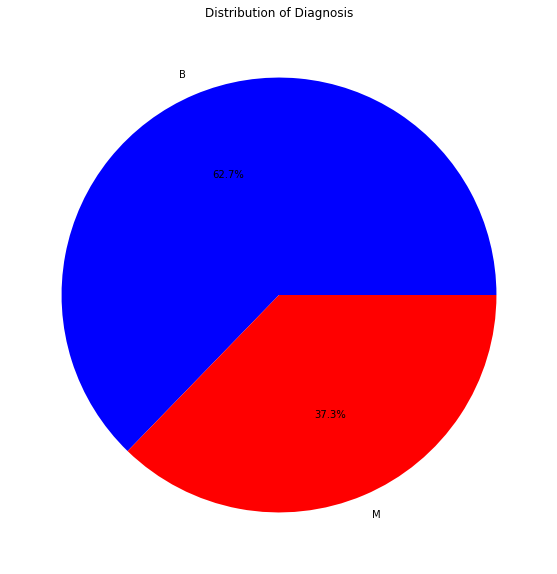

In [15]:
d=data_df["Diagnosis"].value_counts()
labels=d.index
colors=["blue","red"]
explode=[0,0]
sizes=d.values

#visual
plt.figure(figsize=(10,10))
plt.pie(sizes, explode=explode, labels=labels, colors=colors, autopct="%1.1f%%")
plt.title("Distribution of Diagnosis")
plt.show()

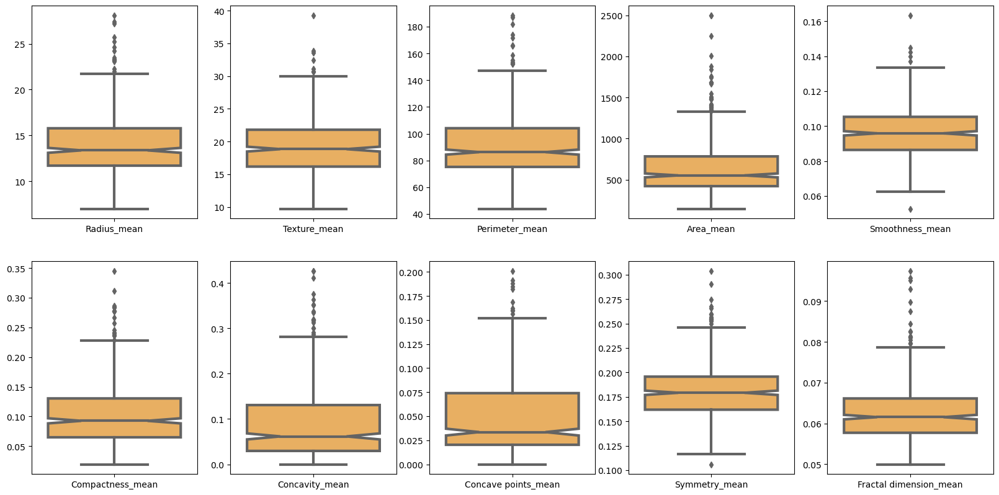

In [16]:
import seaborn as sns
fig = plt.figure(dpi=100, figsize=(20,10))
for i in range(0, 2):
    for j in range(0, 5):
        index = i*5 + j
        ax = fig.add_subplot(2, 5, index+1)
        sns.boxplot(data=data_dropped[features_mean].iloc[:,index].to_frame(),ax=ax, color="#feb24c", linewidth=3, notch = True)

<AxesSubplot:xlabel='Diagnosis', ylabel='Fractal dimension_mean'>

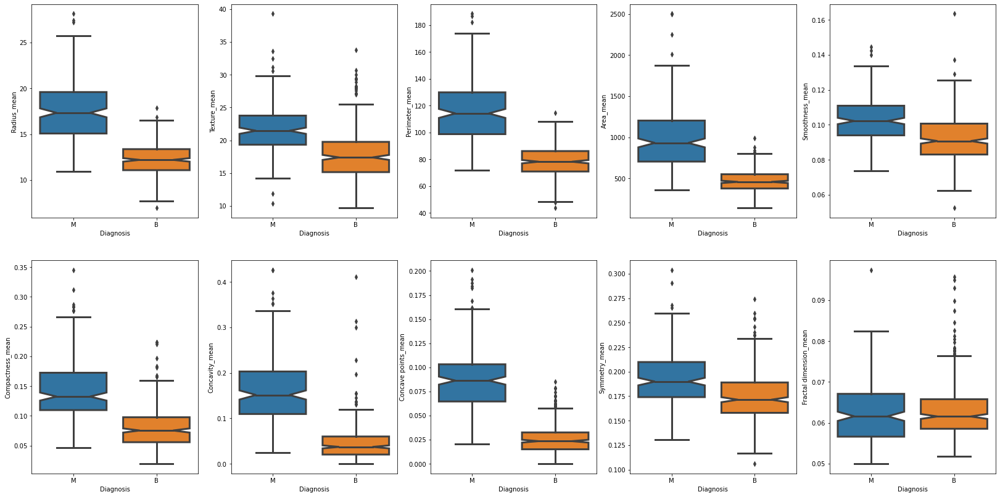

In [17]:
fig = plt.figure(figsize = (28,14))

fig.add_subplot(2, 5, 1)
sns.boxplot(y=data_df1['Radius_mean'], x=data_df1['Diagnosis'],  linewidth=3, notch = True)

fig.add_subplot(2, 5, 2)
sns.boxplot(y=data_df1['Texture_mean'], x=data_df1['Diagnosis'], linewidth=3, notch = True)

fig.add_subplot(2, 5, 3)
sns.boxplot(y=data_df1['Perimeter_mean'], x=data_df1['Diagnosis'],  linewidth=3, notch = True)

fig.add_subplot(2, 5, 4)
sns.boxplot(y=data_df1['Area_mean'], x=data_df1['Diagnosis'],  linewidth=3, notch = True)

fig.add_subplot(2, 5, 5)
sns.boxplot(y=data_df1['Smoothness_mean'], x=data_df1['Diagnosis'],  linewidth=3, notch = True)

fig.add_subplot(2, 5, 6)
sns.boxplot(y=data_df1['Compactness_mean'], x=data_df1['Diagnosis'],  linewidth=3, notch = True)

fig.add_subplot(2, 5, 7)
sns.boxplot(y=data_df1['Concavity_mean'], x=data_df1['Diagnosis'],  linewidth=3, notch = True)

fig.add_subplot(2, 5, 8)
sns.boxplot(y=data_df1['Concave points_mean'], x=data_df1['Diagnosis'], linewidth=3, notch = True)

fig.add_subplot(2, 5, 9)
sns.boxplot(y=data_df1['Symmetry_mean'], x=data_df1['Diagnosis'], linewidth=3, notch = True)

fig.add_subplot(2, 5, 10)
sns.boxplot(y=data_df1['Fractal dimension_mean'], x=data_df1['Diagnosis'], linewidth=3, notch = True)

# Correlation Analysis

<AxesSubplot:>

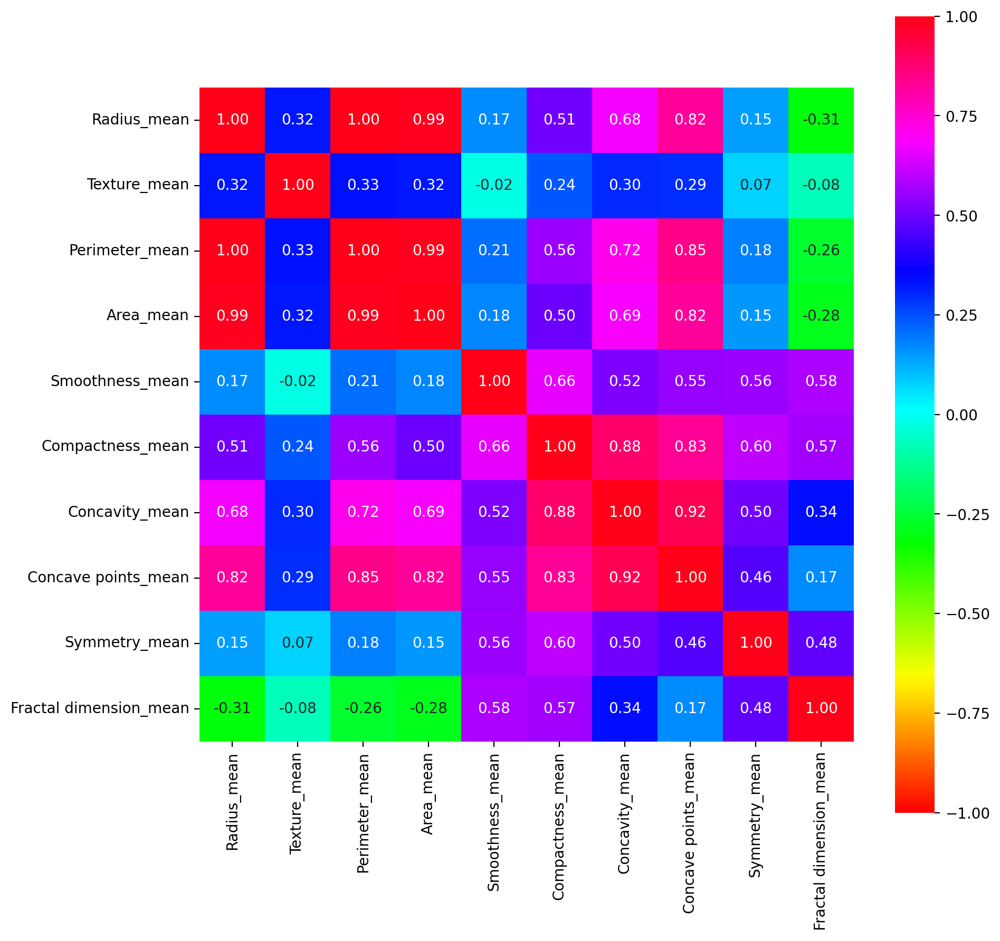

In [18]:
corr = data_dropped[features_mean].corr()
plt.figure(figsize=(10,10),dpi=200)
sns.heatmap(corr, vmin=-1, vmax=1, cbar = True,  square = True, annot=True, fmt= '.2f',annot_kws={'size': 10},
           xticklabels= features_mean, yticklabels= features_mean,
           cmap= 'hsv')

From above, Radius_mean and Perimeter_mean exhibit a strong correlation of 1.00, while Radius_mean and Area_mean show a high correlation of 0.99. This suggests that as Radius_mean increases, Perimeter_mean and Area_mean also increase. Conversely, there is a negative correlation between Texture_mean and Smoothness_mean, indicating that an increase in Texture_mean corresponds to a decrease in Smoothness_mean.

# sklearn Data Preprocessing

In [19]:
cancer = load_breast_cancer()

In [20]:
cancer.data[0]

array([1.799e+01, 1.038e+01, 1.228e+02, 1.001e+03, 1.184e-01, 2.776e-01,
       3.001e-01, 1.471e-01, 2.419e-01, 7.871e-02, 1.095e+00, 9.053e-01,
       8.589e+00, 1.534e+02, 6.399e-03, 4.904e-02, 5.373e-02, 1.587e-02,
       3.003e-02, 6.193e-03, 2.538e+01, 1.733e+01, 1.846e+02, 2.019e+03,
       1.622e-01, 6.656e-01, 7.119e-01, 2.654e-01, 4.601e-01, 1.189e-01])

In [21]:
cancer.target[0]

0

In [22]:
sum(cancer.target==0)

212

In [23]:
data_m = cancer.data[cancer.target==0]
data_b = cancer.data[cancer.target==1]

In [24]:
X = cancer.data
X_std = StandardScaler().fit_transform(X)
X_std

array([[ 1.09706398, -2.07333501,  1.26993369, ...,  2.29607613,
         2.75062224,  1.93701461],
       [ 1.82982061, -0.35363241,  1.68595471, ...,  1.0870843 ,
        -0.24388967,  0.28118999],
       [ 1.57988811,  0.45618695,  1.56650313, ...,  1.95500035,
         1.152255  ,  0.20139121],
       ...,
       [ 0.70228425,  2.0455738 ,  0.67267578, ...,  0.41406869,
        -1.10454895, -0.31840916],
       [ 1.83834103,  2.33645719,  1.98252415, ...,  2.28998549,
         1.91908301,  2.21963528],
       [-1.80840125,  1.22179204, -1.81438851, ..., -1.74506282,
        -0.04813821, -0.75120669]])

In [25]:
z = cancer.target
z

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0,
       1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0,
       1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0,
       0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1,
       1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0,
       0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0,
       1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0,

# Data Visualization

Investigating high-dimensional data through its projection onto a new two-dimensional plane is a significant visualization approach commonly employed in machine learning. This reduction in dimensionality can be achieved through two distinct methods:

1. Feature Selection: Retaining only the most relevant variables from the original dataset (referred to as feature selection).

2. Dimension Reduction Technique: Leveraging the redundancy in the input data to identify a smaller set of new variables, each representing a combination of the original variables and essentially containing the same information. Principal Component Analysis (PCA) and t-distributed stochastic neighbor embedding (t-SNE) are two widely-used methods based on this principle.

- Principal Component Analysis (PCA): PCA involves constructing principal components that lack direct interpretability and real-world significance, as they are formed as linear combinations of the original variables. Geometrically, these components represent the directions in the data that explain the maximum variance, effectively capturing essential information. Mathematically, the eigenvectors of the covariance matrix (of the features) are the principal components, and their corresponding eigenvalues indicate the amount of variance in each component. The components are selected to maximize variance, with the first one having the highest variance, followed by others in descending order.

- t-distributed Stochastic Neighbor Embedding (t-SNE): t-SNE is a non-linear statistical method designed for visualizing high-dimensional data. It maps each data point from the high-dimensional space into a two- or three-dimensional map, ensuring that similar objects are represented by nearby points and dissimilar objects by distant points with high probability. The algorithm consists of two main stages: constructing a probability distribution over pairs of high-dimensional objects based on their similarity and defining a similar distribution over points in the low-dimensional map. t-SNE minimizes the Kullback-Leibler divergence between these two distributions with respect to the positions of the points in the map. Perplexity, a hyperparameter reflecting the estimated number of close neighbors each point has, is crucial and is typically set within the range of 5–50 for robust performance.






- Pairwise Plot 

array([[<AxesSubplot:xlabel='Radius_mean', ylabel='Radius_mean'>,
        <AxesSubplot:xlabel='Texture_mean', ylabel='Radius_mean'>,
        <AxesSubplot:xlabel='Smoothness_mean', ylabel='Radius_mean'>,
        <AxesSubplot:xlabel='Compactness_mean', ylabel='Radius_mean'>,
        <AxesSubplot:xlabel='Symmetry_mean', ylabel='Radius_mean'>,
        <AxesSubplot:xlabel='Fractal dimension_mean', ylabel='Radius_mean'>],
       [<AxesSubplot:xlabel='Radius_mean', ylabel='Texture_mean'>,
        <AxesSubplot:xlabel='Texture_mean', ylabel='Texture_mean'>,
        <AxesSubplot:xlabel='Smoothness_mean', ylabel='Texture_mean'>,
        <AxesSubplot:xlabel='Compactness_mean', ylabel='Texture_mean'>,
        <AxesSubplot:xlabel='Symmetry_mean', ylabel='Texture_mean'>,
        <AxesSubplot:xlabel='Fractal dimension_mean', ylabel='Texture_mean'>],
       [<AxesSubplot:xlabel='Radius_mean', ylabel='Smoothness_mean'>,
        <AxesSubplot:xlabel='Texture_mean', ylabel='Smoothness_mean'>,
        <Axes

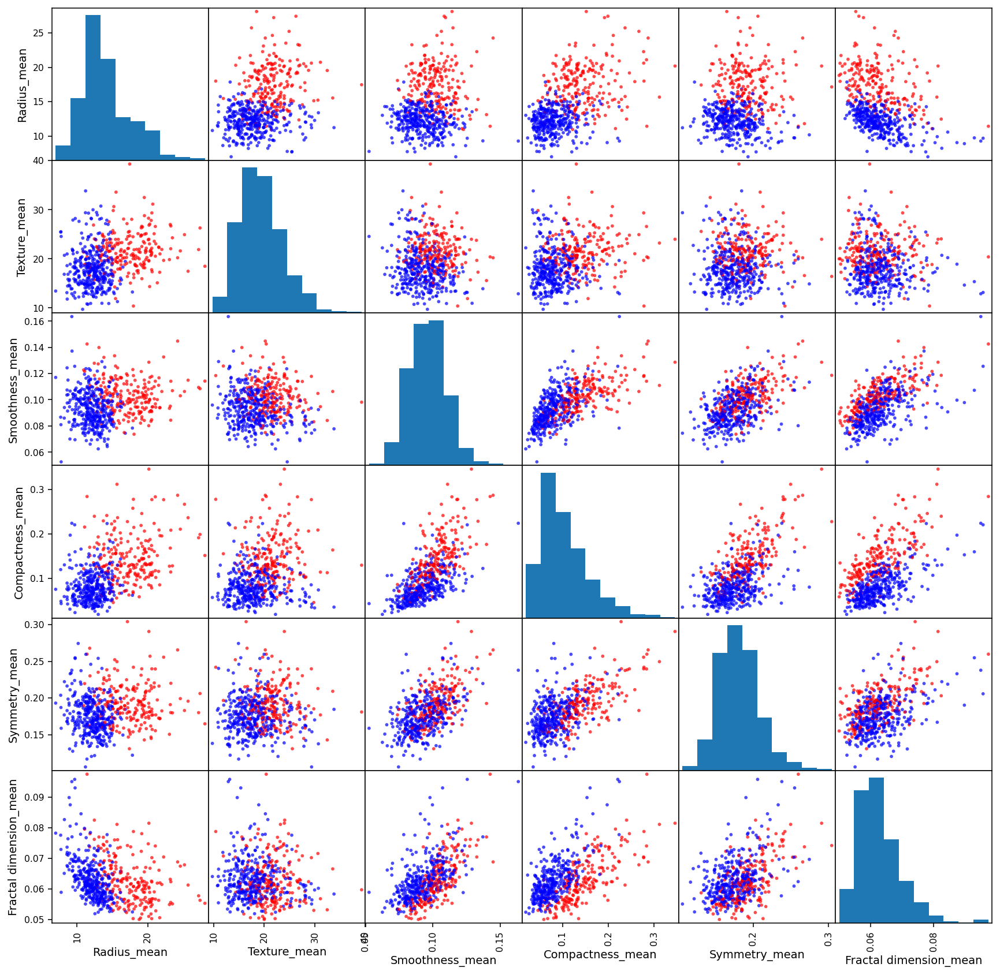

In [26]:
data_pairwise = data_dropped[['Radius_mean', 'Texture_mean', 'Smoothness_mean', 'Compactness_mean', 'Symmetry_mean', 'Fractal dimension_mean']]
color_function = {'M': "red", 'B': "blue"}
colors = data_dropped["Diagnosis"].map(lambda x: color_function.get(x))
plt.rcParams["figure.dpi"] = 140
pd.plotting.scatter_matrix(data_pairwise, c=colors, alpha=0.7, figsize=(15,15), s=35)

# Princpal Component Analysis (PCA)

In [27]:
pca = PCA()
X_reduced = pca.fit_transform(X_std)
X_reduced.shape

(569, 30)

In [28]:
var = pca.explained_variance_ratio_
var

array([4.42720256e-01, 1.89711820e-01, 9.39316326e-02, 6.60213492e-02,
       5.49576849e-02, 4.02452204e-02, 2.25073371e-02, 1.58872380e-02,
       1.38964937e-02, 1.16897819e-02, 9.79718988e-03, 8.70537901e-03,
       8.04524987e-03, 5.23365745e-03, 3.13783217e-03, 2.66209337e-03,
       1.97996793e-03, 1.75395945e-03, 1.64925306e-03, 1.03864675e-03,
       9.99096464e-04, 9.14646751e-04, 8.11361259e-04, 6.01833567e-04,
       5.16042379e-04, 2.72587995e-04, 2.30015463e-04, 5.29779290e-05,
       2.49601032e-05, 4.43482743e-06])

In [29]:
cum_sum = pca.explained_variance_ratio_.cumsum()
cum_sum

array([0.44272026, 0.63243208, 0.72636371, 0.79238506, 0.84734274,
       0.88758796, 0.9100953 , 0.92598254, 0.93987903, 0.95156881,
       0.961366  , 0.97007138, 0.97811663, 0.98335029, 0.98648812,
       0.98915022, 0.99113018, 0.99288414, 0.9945334 , 0.99557204,
       0.99657114, 0.99748579, 0.99829715, 0.99889898, 0.99941502,
       0.99968761, 0.99991763, 0.99997061, 0.99999557, 1.        ])

In [30]:
import plotly.graph_objs as go
import plotly.offline as offline

x_label = ["PC%s" %i for i in range(1, 31)]
trace1 = go.Bar(
    x=x_label,
    y=list(var),
    name="Explained Variance")

trace2 = go.Scatter(
    x=x_label,
    y=cum_sum,
    name="Cumulative Variance")

layout = go.Layout(
    title='Explained variance',
    xaxis=dict(title='Principle Components', tickmode='linear'))

data = [trace1, trace2]
fig = go.Figure(data=data, layout=layout)
offline.iplot(fig)

Text(0.5, 1.0, 'Explained Variance')

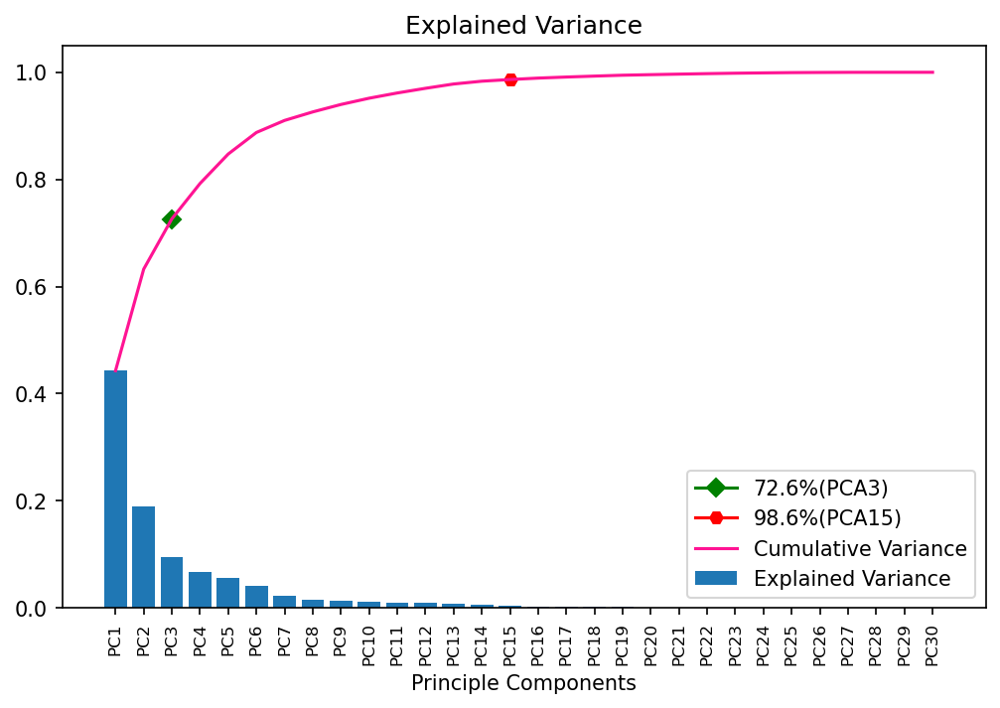

In [31]:
plt.figure(dpi=150, figsize=(8,5))
plt.plot(3, 0.726, marker='D', color='green', label='72.6%(PCA3)')
plt.plot(15, 0.986, marker='H', color='red', label='98.6%(PCA15)')
plt.plot(range(1, 31), cum_sum, color='deeppink', label='Cumulative Variance')
plt.grid(False)
plt.bar(range(1, 31), var, label='Explained Variance')
plt.legend()
plt.xlabel('Principle Components')
plt.xticks(range(1, 31), ('PC1', 'PC2','PC3', 'PC4','PC5', 'PC6','PC7', 'PC8','PC9', 'PC10','PC11', 'PC12','PC13', 'PC14','PC15', 'PC16','PC17', 'PC18','PC19', 'PC20','PC21', 'PC22','PC23', 'PC24','PC25', 'PC26','PC27', 'PC28','PC29', 'PC30'), rotation='vertical', fontsize=8)
plt.title('Explained Variance')

Text(0.5, 0.9, 'First 3 PCA Visualization')

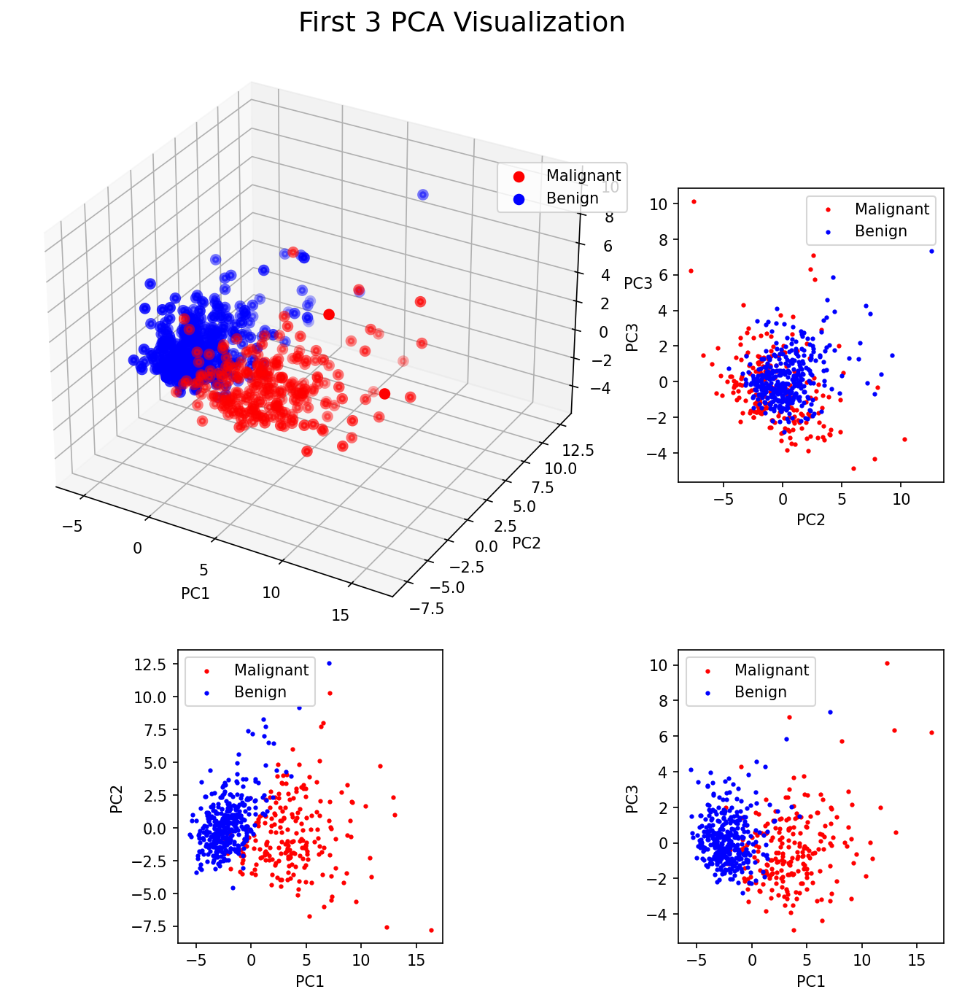

In [32]:
fig = plt.figure(dpi=150, figsize=(11,11))
grid = plt.GridSpec(6, 6, hspace=0.1, wspace=0.7)
ax1 = fig.add_subplot(grid[:4, :4], projection='3d')
ax1.scatter(X_reduced[cancer.target==0][:,0], X_reduced[cancer.target==0][:,1], X_reduced[cancer.target==0][:,2], c='red', linewidths=3, label='Malignant')
ax1.scatter(X_reduced[cancer.target==1][:,0], X_reduced[cancer.target==1][:,1], X_reduced[cancer.target==1][:,2], c='blue', linewidths=3, label='Benign')
ax1.legend(bbox_to_anchor=(0.8, 0.8))
ax1.set_xlabel("PC1")
ax1.set_ylabel("PC2")
ax1.set_zlabel("PC3")
ax2 = fig.add_subplot(grid[4:, 1:3])
ax2.scatter(X_reduced[cancer.target==0][:,0], X_reduced[cancer.target==0][:,1], c='red', s=4, label='Malignant')
ax2.scatter(X_reduced[cancer.target==1][:,0], X_reduced[cancer.target==1][:,1], c='blue', s=4, label='Benign')
ax2.set_xlabel("PC1")
ax2.set_ylabel("PC2")
ax2.legend()
ax3 = fig.add_subplot(grid[1:3, 4:])
ax3.scatter(X_reduced[cancer.target==0][:,1], X_reduced[cancer.target==0][:,2], c='red', s=4, label='Malignant')
ax3.scatter(X_reduced[cancer.target==1][:,1], X_reduced[cancer.target==1][:,2], c='blue', s=4, label='Benign')
ax3.set_xlabel("PC2")
ax3.set_ylabel("PC3")
ax3.legend()
ax4 = fig.add_subplot(grid[4:, 4:])
ax4.scatter(X_reduced[cancer.target==0][:,0], X_reduced[cancer.target==0][:,2], c='red', s=4, label='Malignant')
ax4.scatter(X_reduced[cancer.target==1][:,0], X_reduced[cancer.target==1][:,2], c='blue', s=4, label='Benign')
ax4.set_xlabel("PC1")
ax4.set_ylabel("PC3")
ax4.legend()
fig.suptitle("First 3 PCA Visualization", y=0.9, fontsize=18)

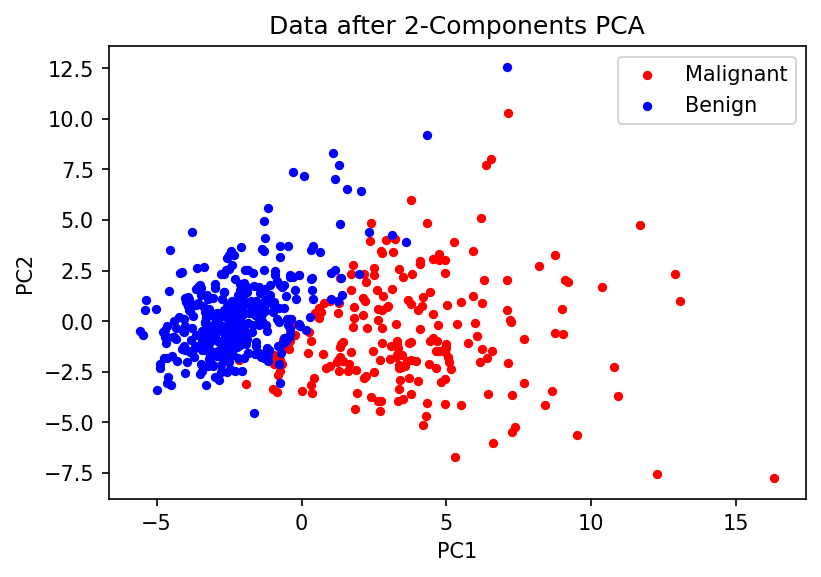

In [33]:
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_std)

fig = plt.figure(dpi=150, figsize=(6,4))
plt.scatter(X_pca[cancer.target==0][:,0], X_pca[cancer.target==0][:,1], c='red', s=12, label='Malignant')
plt.scatter(X_pca[cancer.target==1][:,0], X_pca[cancer.target==1][:,1], c='blue', s=12, label='Benign')
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend()
plt.title("Data after 2-Components PCA")
plt.grid(False)
plt.show()

Text(0.5, 0.9, 'Data after 3-Components PCA Visualization')

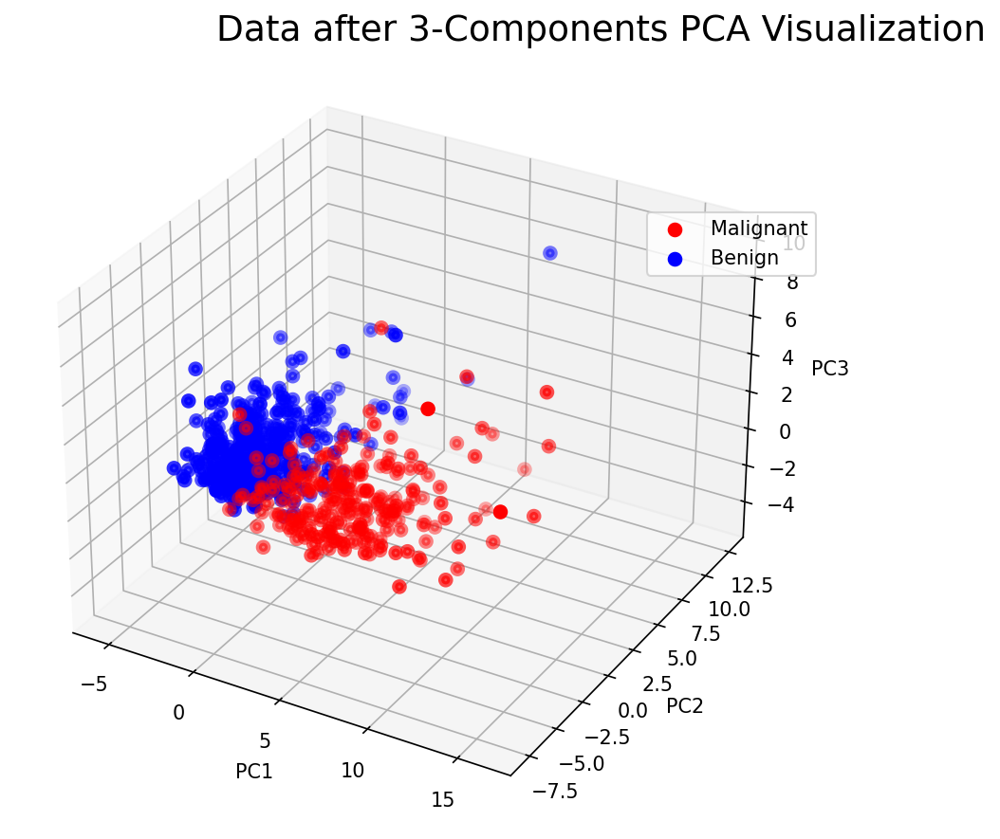

In [34]:
fig = plt.figure(dpi=150, figsize=(11,11))
grid = plt.GridSpec(6, 6, hspace=0.1, wspace=0.7)
ax1 = fig.add_subplot(grid[:4, :4], projection='3d')
ax1.scatter(X_reduced[cancer.target==0][:,0], X_reduced[cancer.target==0][:,1], X_reduced[cancer.target==0][:,2], c='red', linewidths=3, label='Malignant')
ax1.scatter(X_reduced[cancer.target==1][:,0], X_reduced[cancer.target==1][:,1], X_reduced[cancer.target==1][:,2], c='blue', linewidths=3, label='Benign')
ax1.legend(bbox_to_anchor=(0.8, 0.8))
ax1.set_xlabel("PC1")
ax1.set_ylabel("PC2")
ax1.set_zlabel("PC3")
fig.suptitle("Data after 3-Components PCA Visualization", y=0.9, fontsize=18)

# t-Distributed Stochastic Neighbor Embedding (t-SNE)

In [35]:
import warnings
warnings.filterwarnings('ignore')
X_tsne2 = TSNE(n_components=2,random_state=0).fit_transform(X_std)

Text(0.5, 1.0, 'T-SNE Visualization')

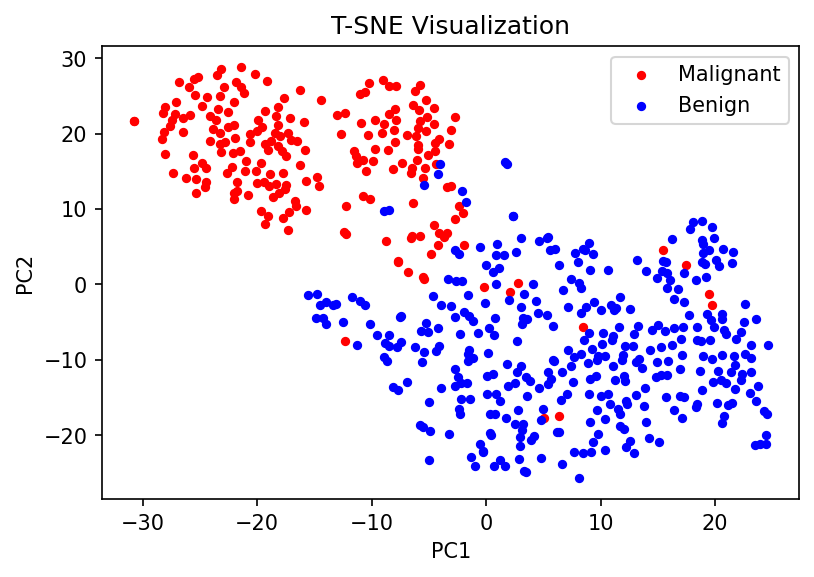

In [36]:
fig = plt.figure(dpi=150, figsize=(6,4))
plt.scatter(X_tsne2[cancer.target==0][:,0], X_tsne2[cancer.target==0][:,1], c='red', s=12, label='Malignant')
plt.scatter(X_tsne2[cancer.target==1][:,0], X_tsne2[cancer.target==1][:,1], c='blue', s=12, label='Benign')
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend()
plt.grid(False)
plt.title("T-SNE Visualization")

In [37]:
X_tsne = TSNE(n_components=3).fit_transform(X_std)
X_tsne.shape

(569, 3)

Text(0.5, 0.9, 'T-SNE Visualization')

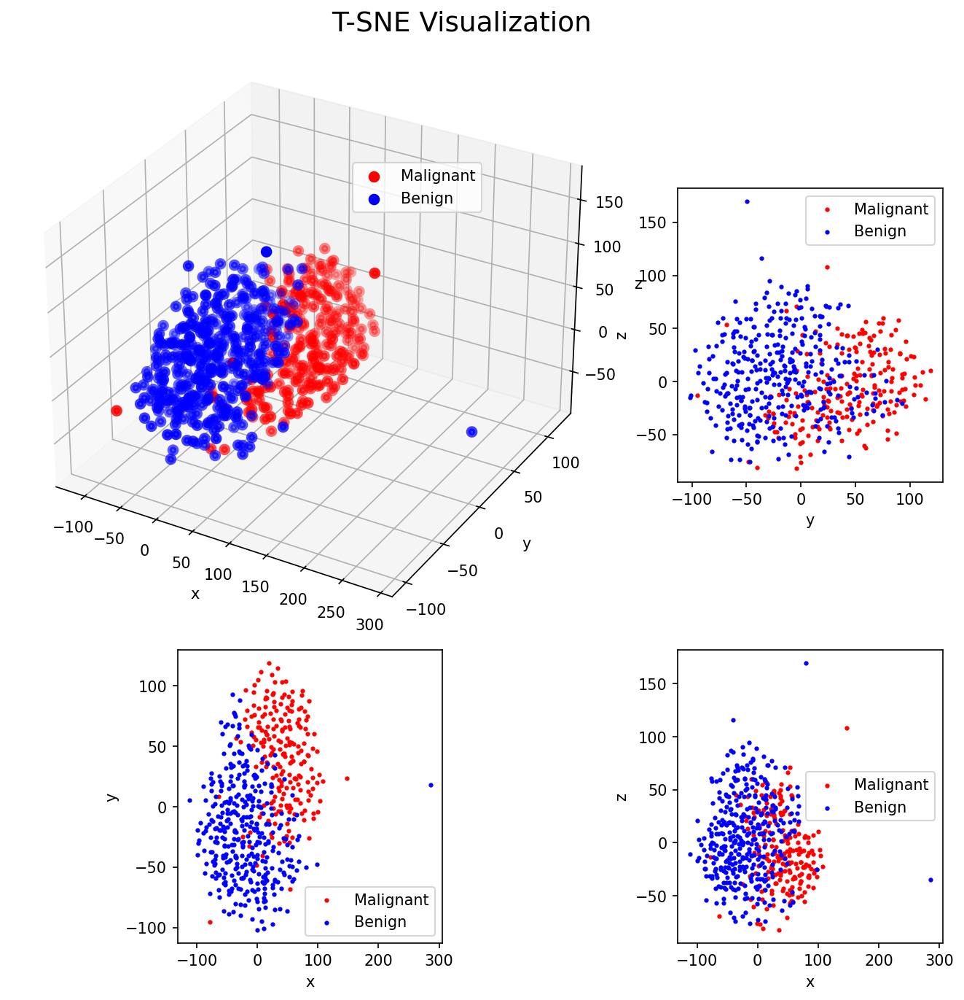

In [38]:
fig = plt.figure(dpi=150, figsize=(11,11))
grid = plt.GridSpec(6, 6, hspace=0.1, wspace=0.7)
ax1 = fig.add_subplot(grid[:4, :4], projection='3d')
ax1.scatter(X_tsne[cancer.target==0][:,0], X_tsne[cancer.target==0][:,1], X_tsne[cancer.target==0][:,2], c='red', linewidths=3, label='Malignant')
ax1.scatter(X_tsne[cancer.target==1][:,0], X_tsne[cancer.target==1][:,1], X_tsne[cancer.target==1][:,2], c='blue', linewidths=3, label='Benign')
ax1.legend(bbox_to_anchor=(0.8, 0.8))
ax1.set_xlabel("x")
ax1.set_ylabel("y")
ax1.set_zlabel("z")
ax2 = fig.add_subplot(grid[4:, 1:3])
ax2.scatter(X_tsne[cancer.target==0][:,0], X_tsne[cancer.target==0][:,1], c='red', s=4, label='Malignant')
ax2.scatter(X_tsne[cancer.target==1][:,0], X_tsne[cancer.target==1][:,1], c='blue', s=4, label='Benign')
ax2.set_xlabel("x")
ax2.set_ylabel("y")
ax2.legend()
ax3 = fig.add_subplot(grid[1:3, 4:])
ax3.scatter(X_tsne[cancer.target==0][:,1], X_tsne[cancer.target==0][:,2], c='red', s=4, label='Malignant')
ax3.scatter(X_tsne[cancer.target==1][:,1], X_tsne[cancer.target==1][:,2], c='blue', s=4, label='Benign')
ax3.set_xlabel("y")
ax3.set_ylabel("z")
ax3.legend()
ax4 = fig.add_subplot(grid[4:, 4:])
ax4.scatter(X_tsne[cancer.target==0][:,0], X_tsne[cancer.target==0][:,2], c='red', s=4, label='Malignant')
ax4.scatter(X_tsne[cancer.target==1][:,0], X_tsne[cancer.target==1][:,2], c='blue', s=4, label='Benign')
ax4.set_xlabel("x")
ax4.set_ylabel("z")
ax4.legend()
fig.suptitle("T-SNE Visualization", y=0.9, fontsize=18)

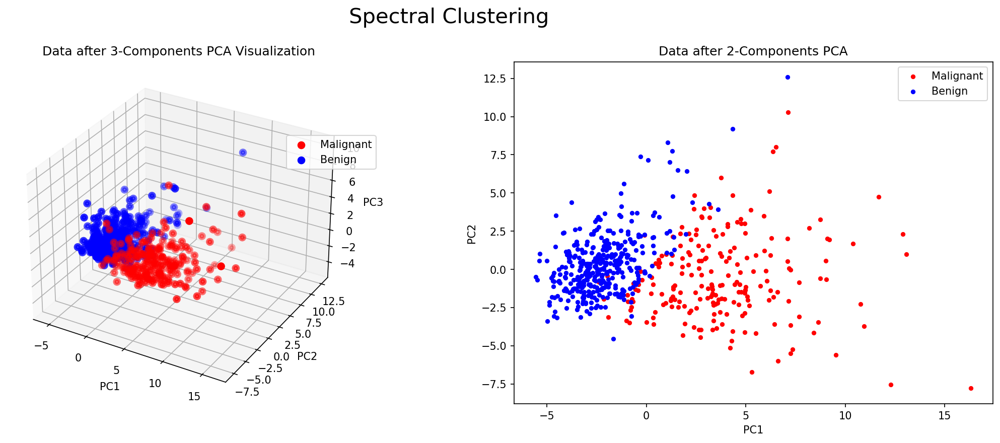

In [39]:
fig = plt.figure(dpi=150, figsize=(18, 6))

# Plotting 3-components PCA
ax1 = fig.add_subplot(121, projection='3d')
ax1.scatter(X_reduced[cancer.target==0][:,0], X_reduced[cancer.target==0][:,1], X_reduced[cancer.target==0][:,2], c='red', linewidths=3, label='Malignant')
ax1.scatter(X_reduced[cancer.target==1][:,0], X_reduced[cancer.target==1][:,1], X_reduced[cancer.target==1][:,2], c='blue', linewidths=3, label='Benign')
ax1.set_xlabel("PC1")
ax1.set_ylabel("PC2")
ax1.set_zlabel("PC3")
ax1.legend(bbox_to_anchor=(0.8, 0.8))
ax1.set_title("Data after 3-Components PCA Visualization")

# Plotting 2-components PCA
ax2 = fig.add_subplot(122)
ax2.scatter(X_pca[cancer.target==0][:,0], X_pca[cancer.target==0][:,1], c='red', s=12, label='Malignant')
ax2.scatter(X_pca[cancer.target==1][:,0], X_pca[cancer.target==1][:,1], c='blue', s=12, label='Benign')
ax2.set_xlabel("PC1")
ax2.set_ylabel("PC2")
ax2.legend()
ax2.set_title("Data after 2-Components PCA")

fig.suptitle("Spectral Clustering", y=1, fontsize=20)
plt.show()

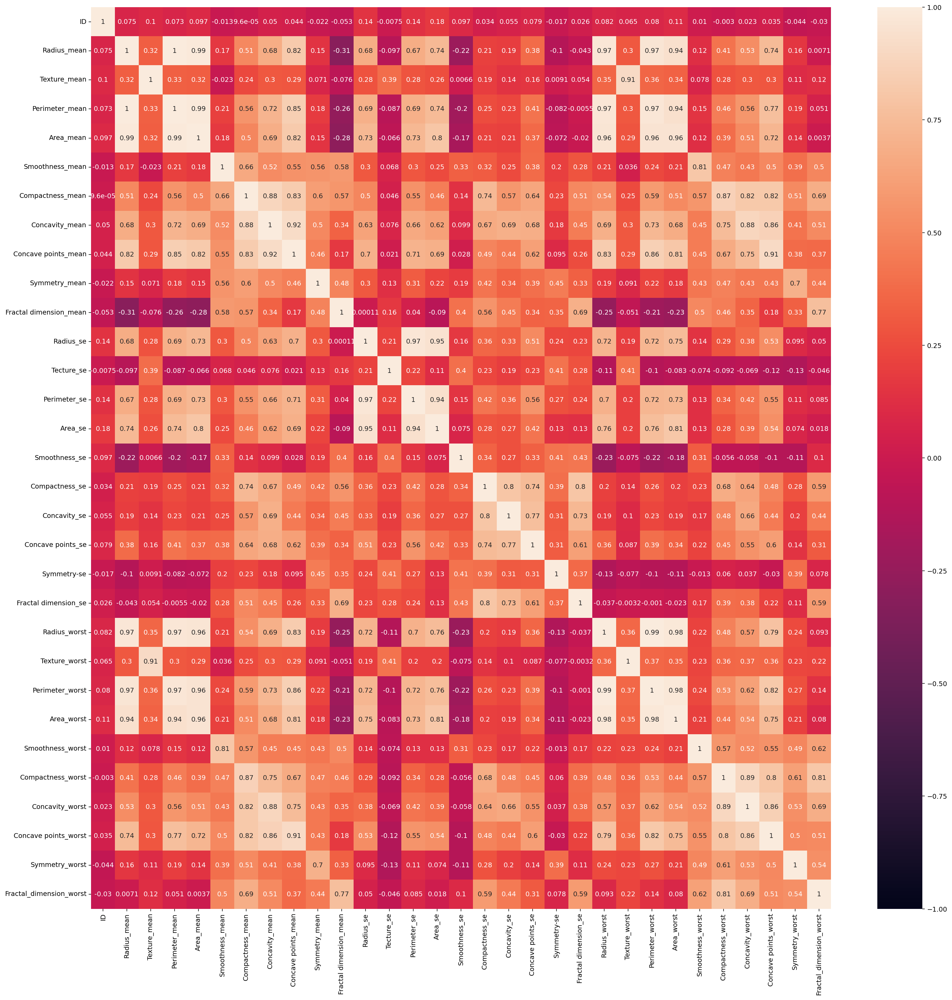

In [40]:
plt.figure(figsize =(25,25))
sns.heatmap(data_df.corr(), vmin=-1, vmax=1, annot=True)
#plt.title('Full correlation map of the numerical attributes')
plt.show()

                              Complete correlation map of the numerical characteristics.

<AxesSubplot:>

<Figure size 840x560 with 0 Axes>

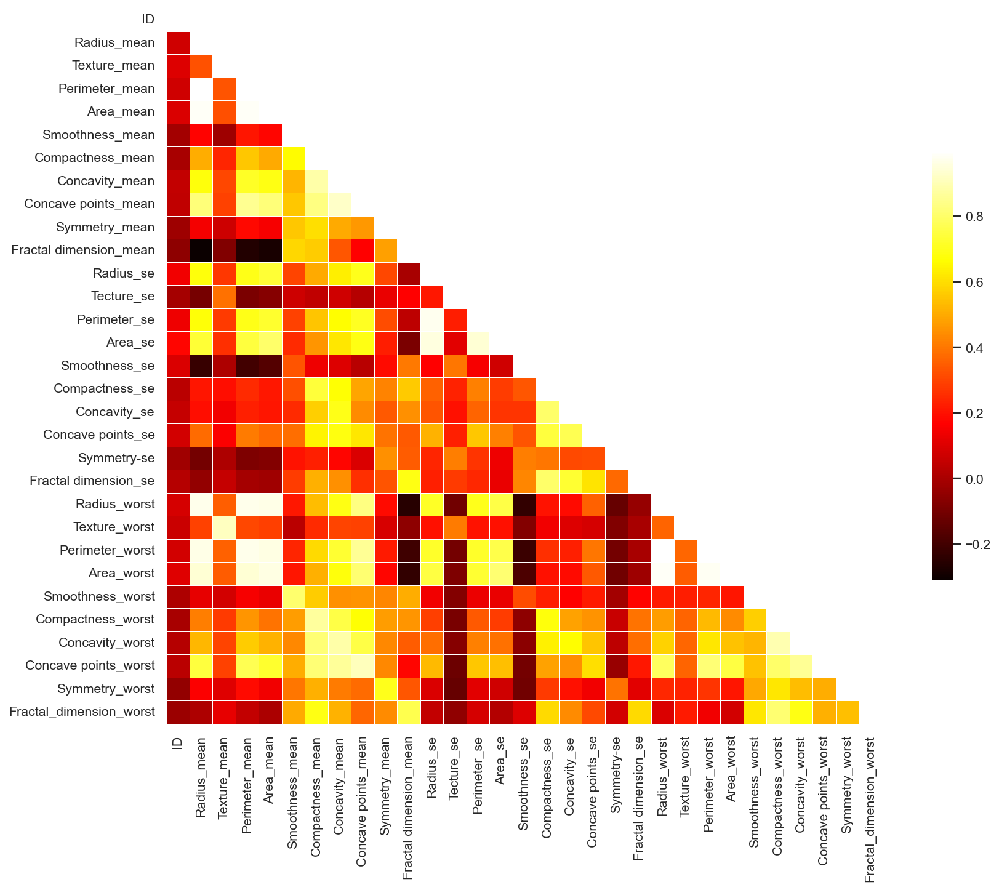

In [41]:
# Apply a fancy colormap to the figure
cmap = plt.get_cmap('hot')
plt.set_cmap(cmap)
sns.set_theme(style="white")
corr = data_df.corr()
# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))
# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(15, 11))
# Generate a custom diverging colormapcmap = sns.diverging_palette(230, 20, as_cmap=True)
#plt.title('Diagonal Correlation Matrix for quick viewing')
sns.heatmap(corr, mask=mask, cmap=cmap,square=True, linewidths=.5, cbar_kws={"shrink": .6})

                             Diagonal Correlation Matrix for quick viewing.

# Observations:
When interpreting a correlation heatmap, the degree of correlation between two variables (features) is determined by the correlation value. The following correlations were observed:

- Radius, Area, and Perimeter exhibit a strong correlation (corr > 0.9), which is expected since area and perimeter are derived from radius values.


- Texture_mean and texture_worst are highly correlated with a correlation value of 0.98, where texture_worst represents the largest texture value among all textures.


- Compactness_mean, concavity_mean, and concave points_mean show significant correlations ranging from 0.7 to 0.9.


- Symmetry_mean and symmetry_worst exhibit a correlation with values around 0.7.


- Fractal dimension_mean and fractal dimension_worst are correlated with a value of 0.77.





# Determination of the optimal number of cluster


# Elbow and Silhoutte Method

In [42]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.cluster import SpectralClustering
from sklearn.metrics import davies_bouldin_score
#from pyclustertend import hopkins

sdata_dropped1 = StandardScaler().fit_transform(data_dropped1)

pca = PCA(n_components=2)
principalComponents = pca.fit_transform(sdata_dropped1)

pcadata_dropped1 = pd.DataFrame(data = principalComponents, columns = ['PC1', 'PC2'])

pcadata_dropped1.head()

,PC1,PC2
0,9.192837,1.948583
1,2.387802,-3.768172
2,5.733896,-1.075174
3,7.122953,10.275589
4,3.935302,-1.948072


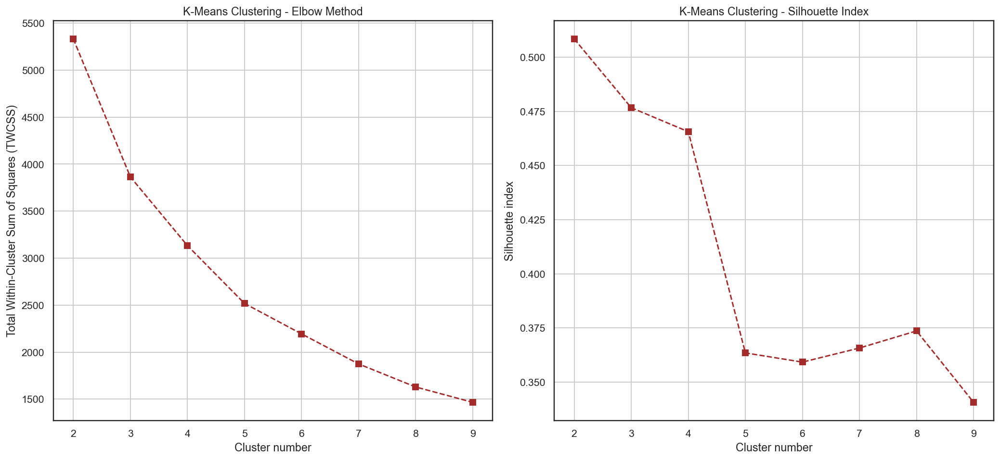

In [43]:
# Elbow method
Sum_of_squared_distances = []
silhouette_avg = []
K = range(2, 10)

plt.figure(figsize=(15, 7))

# Plotting Elbow Method
plt.subplot(1, 2, 1)
for num_clusters in K:
    kmeans = KMeans(n_clusters=num_clusters, n_init=25)
    kmeans.fit(pcadata_dropped1)
    Sum_of_squared_distances.append(kmeans.inertia_)

plt.plot(K, Sum_of_squared_distances, 's-', linestyle='--', color='brown')
plt.xlabel('Cluster number')
plt.ylabel('Total Within-Cluster Sum of Squares (TWCSS)')
plt.title('K-Means Clustering - Elbow Method')
plt.grid(True)

# Plotting Silhouette Score
plt.subplot(1, 2, 2)
for num_clusters in K:
    km = KMeans(n_clusters=num_clusters, n_init=25)
    km.fit(pcadata_dropped1)
    cluster_labels = km.labels_
    silhouette_avg.append(silhouette_score(pcadata_dropped1, cluster_labels))

plt.plot(K, silhouette_avg, 's-', linestyle='--', color='brown')
plt.xlabel('Cluster number')
plt.ylabel('Silhouette index')
plt.title('K-Means Clustering - Silhouette Index')
plt.grid(True)

plt.tight_layout()
plt.show()

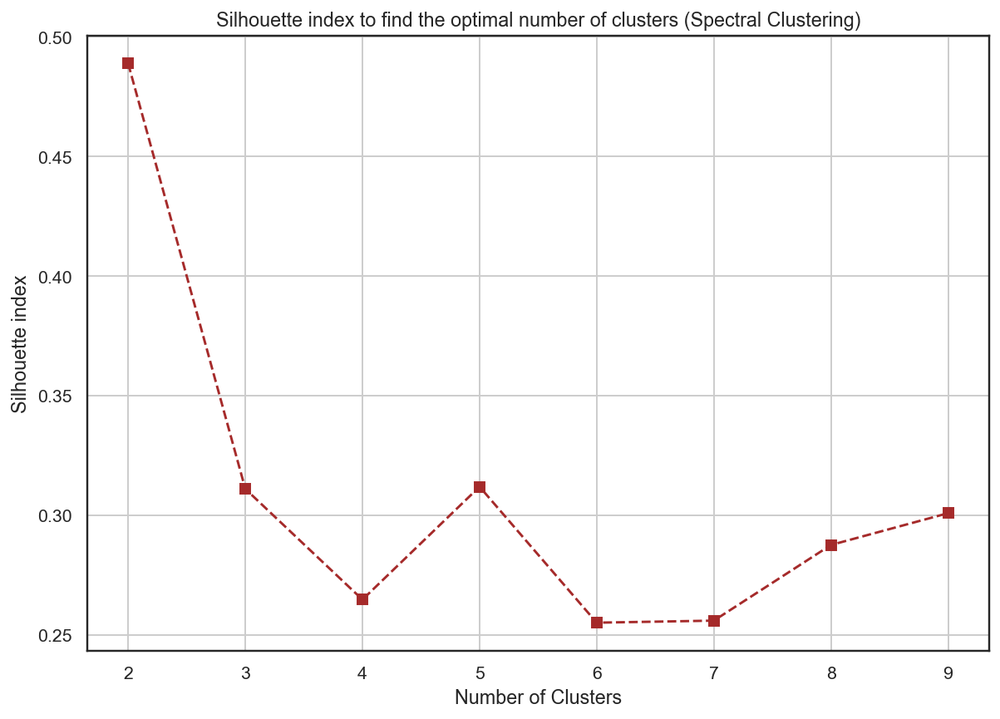

In [44]:
# Standardize the features
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

# Apply PCA for dimensionality reduction
pca = PCA(n_components=2)
pcadata_dropped1 = pca.fit_transform(X_std)

# Silhouette Score for Spectral Clustering
silhouette_avg = []
n_clusters_range = range(2, 10)

for n_clusters in n_clusters_range:
    spectral = SpectralClustering(n_clusters=n_clusters, random_state=42, affinity='nearest_neighbors')
    labels = spectral.fit_predict(pcadata_dropped1)
    
    # Skip calculation if only one cluster
    if len(set(labels)) > 1:
        silhouette_avg.append(silhouette_score(pcadata_dropped1, labels))
    else:
        silhouette_avg.append(np.nan)

plt.figure(figsize=(10, 7))
plt.plot(n_clusters_range, silhouette_avg, 's-', linestyle='--', color='brown')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette index')
plt.title('Silhouette index to find the optimal number of clusters (Spectral Clustering)')
plt.grid(True)
plt.show()

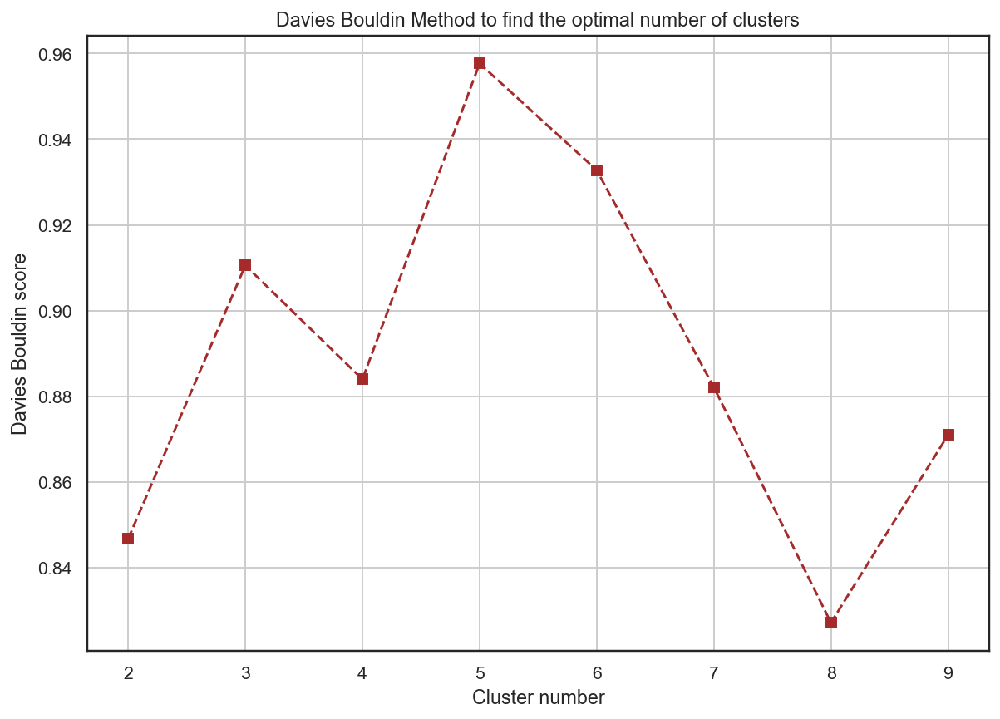

In [45]:
from sklearn.metrics import davies_bouldin_score

K = range(2, 10)
db = []
for num_clusters in K:
 
 # initialise kmeans
 kmeans = KMeans(n_clusters=num_clusters, n_init=25)
 kmeans.fit(pcadata_dropped1)
 cluster_labels = kmeans.fit_predict(pcadata_dropped1)
 
 # Davies Bouldin score
 db.append(davies_bouldin_score(pcadata_dropped1, cluster_labels))


plt.figure(figsize=(10,7))
plt.plot(K,db,'s-', linestyle='--', color='brown')
plt.xlabel('Cluster number') 
plt.ylabel('Davies Bouldin score') 
plt.title('Davies Bouldin Method to find the optimal number of clusters')
plt.grid(True)
plt.show()

# Cluster Validation for k-Means k=2

# Silhouette index

In [50]:
from sklearn.cluster import KMeans

kmeans2 = KMeans(n_clusters=2, random_state=0, n_init=25, algorithm='auto') 

kmeans2.fit(pcadata_dropped1)

KMeans(n_clusters=2, n_init=25, random_state=0)

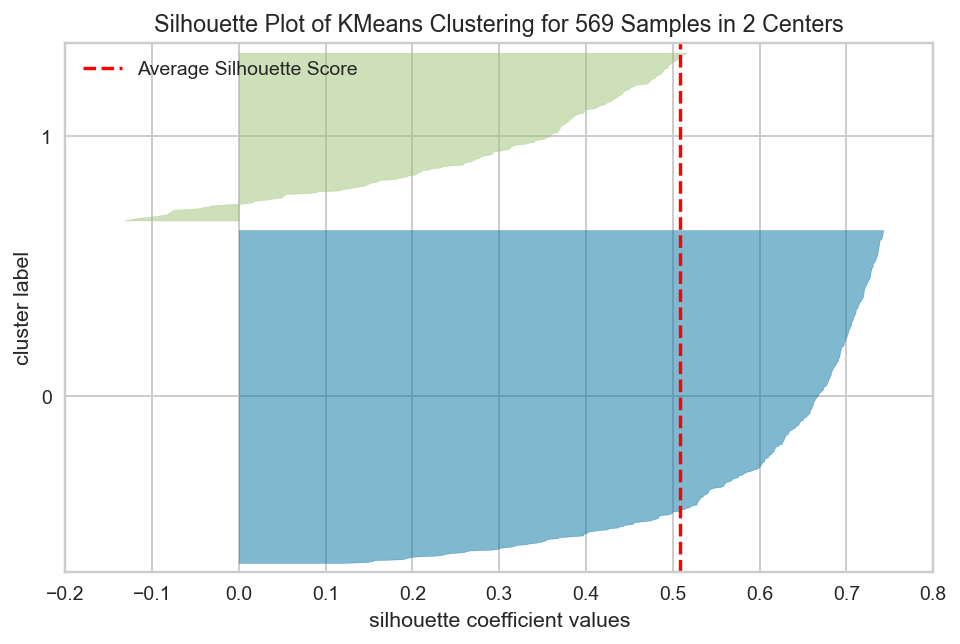

SilhouetteVisualizer(ax=<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 569 Samples in 2 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>,
                     colors='yellowbrick',
                     estimator=KMeans(n_clusters=2, n_init=25, random_state=0))

In [51]:
from yellowbrick.cluster import silhouette_visualizer
plt.figure(figsize=(8,5))
silhouette_visualizer(kmeans2, pcadata_dropped1, colors='yellowbrick')

Upon reviewing the silhouette values graph for each observation, it becomes evident that certain observations in the initial yellow-colored cluster exhibit negative values. This suggests a potential misassignment of these observations to the incorrect cluster.

In [ ]:
silhouette_score(pcadata_dropped1, kmeans2.labels_)

Mean silhouette score is 0.5084690190673562

In [ ]:
clusteringalgorithm = ["k-Means"]
clusternumber = [2]
Overlap = ["None"]
NegativeSilhouette = [1]
AverageSilhouette = [0.50]

# Calinski-Harabasz Score

In [87]:
from sklearn.metrics import calinski_harabasz_score
calinski_harabasz_score(pcadata_dropped1, kmeans2.labels_)

580.8762723566093

Chscores = 580.8762723566145

In [88]:
from sklearn.metrics.cluster import adjusted_rand_score
adjusted_rand_score(data_df1['Diagnosis'],kmeans2.labels_)

0.6592305570949524

Randscores = 0.6592305570949524

In [89]:
data_df1 = data_df1.assign(
    Diagnosis = lambda dataframe: dataframe["Diagnosis"].map(lambda Diagnosis: 0 if Diagnosis == "M" else 1)
)

# Accuracy rate

In [90]:
from sklearn.metrics import accuracy_score
accuracy_score(data_df1['Diagnosis'],kmeans2.labels_)

0.09314586994727592

Accuracy = 0.093

# Cluster Validation for k-Means k = 3

# Silhouette

K-means3 k = 3

In [91]:
kmeans3 = KMeans(n_clusters=3, random_state=0, n_init=25, algorithm='auto') 
kmeans3.fit(pcadata_dropped1)

KMeans(n_clusters=3, n_init=25, random_state=0)

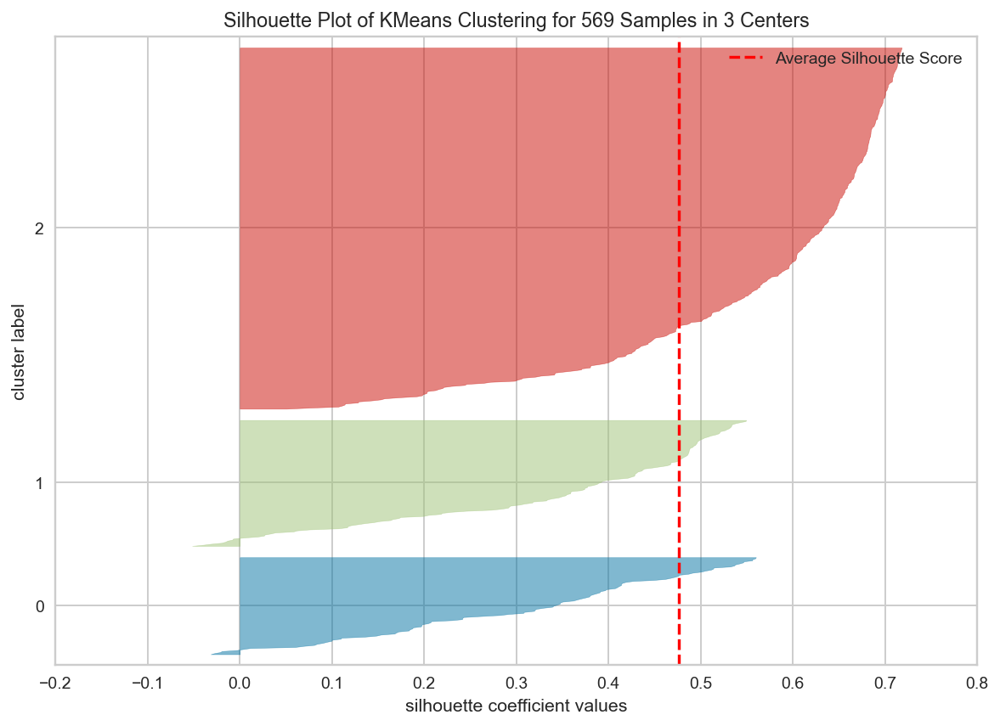

SilhouetteVisualizer(ax=<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 569 Samples in 3 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>,
                     colors='yellowbrick',
                     estimator=KMeans(n_clusters=3, n_init=25, random_state=0))

In [92]:
from yellowbrick.cluster import silhouette_visualizer
plt.figure(figsize=(10,7))
silhouette_visualizer(kmeans3, pcadata_dropped1, colors='yellowbrick')

Upon inspecting the graph displaying silhouette values for each observation, it becomes evident that certain observations in both the yellow and blue clusters exhibit negative values.

In [93]:
silhouette_score(pcadata_dropped1, kmeans3.labels_)

0.47667244607395215

The mean silhouette value recorded was 0.4766724460754236, and this will be compared with other clustering results.

In [94]:
clusteringalgorithm = ["kmeans2", "kmeans3"]
clusternumber = [2,3]
Overlap = ["None", "None"]
NegativeSilhouette = [1,1]
AverageSilhouette = [0.50, 0.47]

# Calinski-Harabasz

In [95]:
calinski_harabasz_score(pcadata_dropped1, kmeans3.labels_)

507.56110745923326

# Adjusted Rand Score

In [96]:
adjusted_rand_score(data_df1['Diagnosis'],kmeans3.labels_)

0.5339418861851445

# Accuracy rate

In [97]:
accuracy_score(data_df1['Diagnosis'],kmeans2.labels_)

0.09314586994727592

# Hierrarchical Clustering

In this part, I will apply the hierarchical clustering algorithm using Ward's Minimum Variance and Average Linkage methods to cluster the dataset.

- Ward's Minimum Variance Method

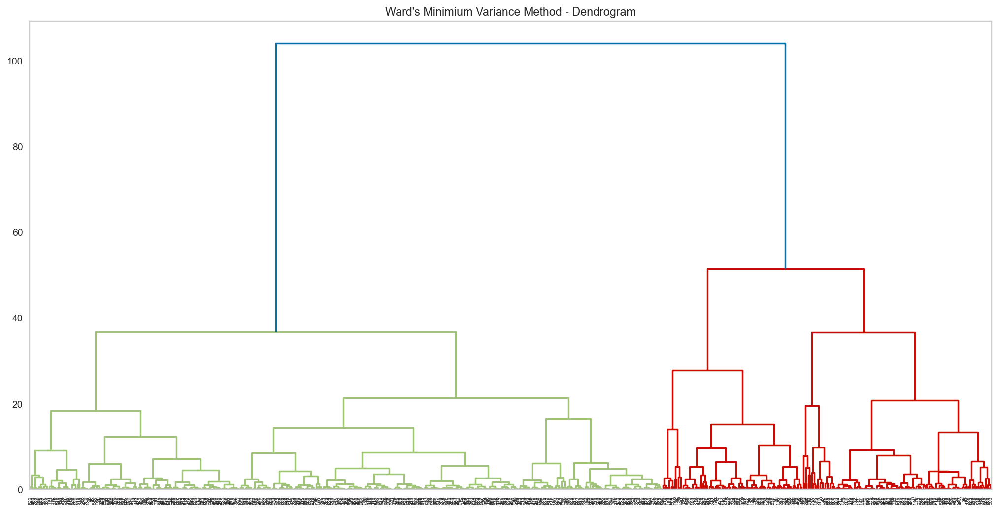

In [98]:
import scipy.cluster.hierarchy as sch
plt.figure(figsize = (18 ,9))

dendrogram = sch.dendrogram(sch.linkage(pcadata_dropped1, method  = "ward"))

plt.title("Ward's Minimium Variance Method - Dendrogram")
plt.grid(False)
plt.show()

Based on the dendrogram, it is advisable to set the cutting distance within the range of 35-40. Therefore, employing 2 clusters seems suitable for this approach.

# Cluster Validation for Ward's Method

# Silhouette

In [99]:
from sklearn.cluster import AgglomerativeClustering
hc = AgglomerativeClustering(n_clusters=2, affinity="euclidean", linkage="ward")
ward2 = hc.fit_predict(pcadata_dropped1)

In [100]:
from sklearn.metrics import silhouette_samples
from sklearn.metrics.pairwise import euclidean_distances
dist = euclidean_distances(pcadata_dropped1,pcadata_dropped1)
wardsilhouettes = silhouette_samples(dist, ward2)

In [101]:
np.where(wardsilhouettes < 0)

(array([ 16,  29,  47,  64,  65,  75,  81, 119, 128, 131, 132, 141, 167,
        182, 197, 201, 215, 223, 247, 253, 264, 330, 444, 465, 566],
       dtype=int64),)

Upon reviewing the silhouette values for each data point in the dataset, it is apparent that certain samples have negative silhouette values, suggesting inaccuracies in their assigned clusters.

In [102]:
silhouette_score(pcadata_dropped1, ward2)

0.5046397728339544

Mean Silhouette value for this clustering is 0.5046397728338755

In [103]:
clusteringalgorithm = ["kmeans2", "kmeans3", "kmedodis2", "ward2"]
clusternumber = [2,3,2,2]
Overlap = ["None", "None", "None", "Yes"]
NegativeSilhouette = [1,1,1,1]
AverageSilhouette = [0.50, 0.47, 0.49, 0.50]

# Calinski - Harabasz Method, Adjusted Rand Index, and Accuracy Rate

In [104]:
calinski_harabasz_score(pcadata_dropped1, ward2)

568.9385429065501

In [105]:
adjusted_rand_score(data_df1['Diagnosis'],ward2)

0.6594271719206948

In [106]:
accuracy_score(data_df1['Diagnosis'],ward2)

0.9068541300527241

- Average Linkage Method

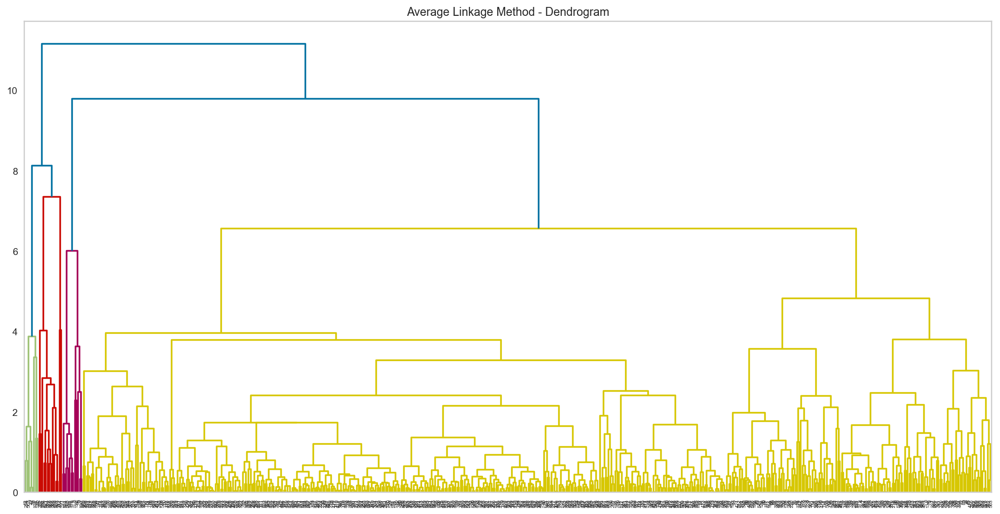

In [130]:
plt.figure(figsize = (18 ,9))

dendrogram = sch.dendrogram(sch.linkage(pcadata_dropped1, method  = "average"))

plt.title("Average Linkage Method - Dendrogram")
plt.grid(False)
plt.show()

Based on the dendrogram, there will be an inbalance in the number of observations in each cluster in both scenarios. However, it seems that using 3 clusters is appropriate for this method.

# Validation Metrics for Average Linkage

# Silhouette

In [108]:
from sklearn.cluster import AgglomerativeClustering
hc = AgglomerativeClustering(n_clusters=2, affinity="euclidean", linkage="average")
average3 = hc.fit_predict(pcadata_dropped1)

In [109]:
averagesilhouettes = silhouette_samples(dist, average3)
np.where(averagesilhouettes < 0)

(array([  2,   3,   9,  18,  23,  25,  30,  68,  77, 152, 162, 164, 181,
        190, 202, 219, 250, 252, 256, 257, 300, 302, 323, 351, 366, 379,
        393, 400, 417, 468, 504, 505, 562, 563], dtype=int64),)

The number of observations with negative silhouette values exceeds that of other clustering algorithms. This is anticipated given the imbalance in the distribution of observations across clusters.

In [110]:
silhouette_score(pcadata_dropped1, average3)

0.5297928970456539

Mean Silhouette value for this clustering is 0.5297928970458512 

In [111]:
clusteringalgorithm.append("average3")
clusternumber.append(3)
Overlap.append("Yes")
NegativeSilhouette.append(1)
AverageSilhouette.append(0.52)

# Calinski - Harabasz Method, Adjusted Rand Index, and Accuracy Rate

In [112]:
calinski_harabasz_score(pcadata_dropped1, average3)

141.5253130160828

In [113]:
adjusted_rand_score(data_df1['Diagnosis'],average3)

0.05802389333244237

In [114]:
accuracy_score(data_df1['Diagnosis'],average3)

0.3339191564147627

# k-Medoids Clustering

In [115]:
from sklearn_extra.cluster import KMedoids

# Determination of the optimal number of clusters

Elbow Method

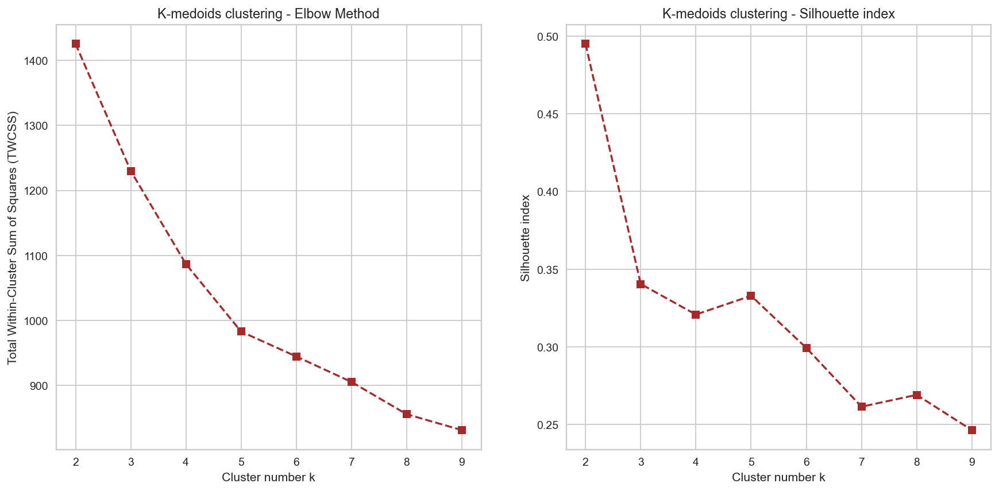

In [116]:
# Elbow method
Sum_of_squared_distances = []
K = range(2, 10)
for num_clusters in K:
    kmedoid = KMedoids(n_clusters=num_clusters)
    kmedoid.fit(pcadata_dropped1)
    Sum_of_squared_distances.append(kmedoid.inertia_)

# Silhouette score
silhouette_avg = []
for num_clusters in K:
    kmedoid = KMedoids(n_clusters=num_clusters)
    kmedoid.fit(pcadata_dropped1)
    silhouette_avg.append(silhouette_score(pcadata_dropped1, kmedoid.labels_))

# Plotting side by side
plt.figure(figsize=(15, 7))

# Elbow Method
plt.subplot(1, 2, 1)
plt.plot(K, Sum_of_squared_distances, 's-', linestyle='--', color='brown')
plt.xlabel('Cluster number k') 
plt.ylabel('Total Within-Cluster Sum of Squares (TWCSS)') 
plt.title('K-medoids clustering - Elbow Method')

# Silhouette Plot
plt.subplot(1, 2, 2)
plt.plot(K, silhouette_avg, 's-', linestyle='--', color='brown')
plt.xlabel('Cluster number k')
plt.ylabel('Silhouette index')
plt.title('K-medoids clustering - Silhouette index')
plt.grid(True)
plt.show()

# Davies Bouldin Method

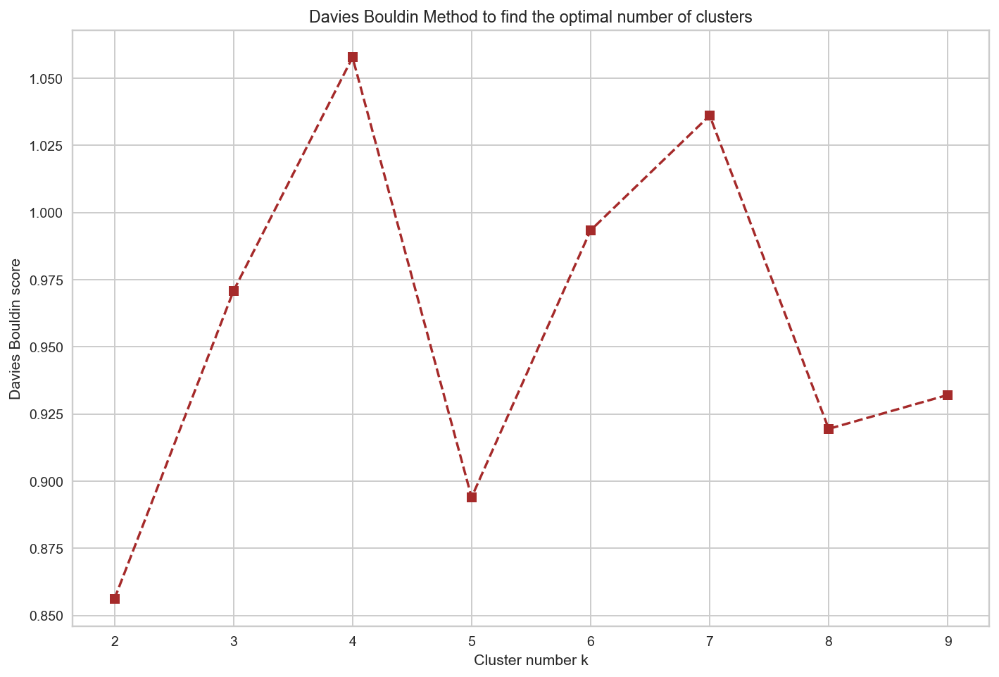

In [117]:
K = range(2, 10)
db = []
for num_clusters in K:
 
 # initialise kmeans
 kmedoids = KMedoids(n_clusters=num_clusters)
 kmedoids.fit(pcadata_dropped1)
 cluster_labels = kmedoids.fit_predict(pcadata_dropped1)
 
 # silhouette score
 db.append(davies_bouldin_score(pcadata_dropped1, cluster_labels))


plt.figure(figsize=(12,8))
plt.plot(K,db,'s-', linestyle='--', color='brown')
plt.xlabel('Cluster number k') 
plt.ylabel('Davies Bouldin score') 
plt.title('Davies Bouldin Method to find the optimal number of clusters')
plt.grid(True)
plt.show()

# K-medoids for k = 2

In [118]:
kmedoids2 = KMedoids(n_clusters=2)
kmedoids2.fit(pcadata_dropped1)

KMedoids(n_clusters=2)

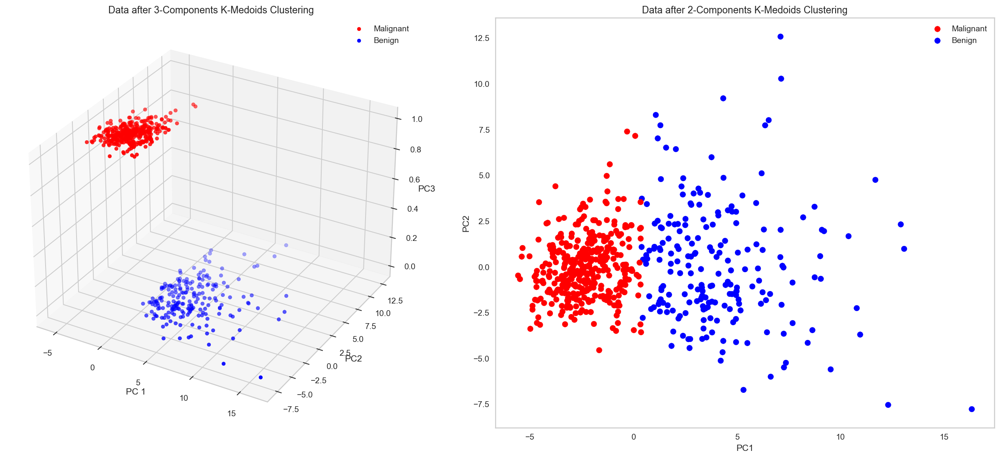

In [119]:
# Standardize the features
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

# Apply PCA for dimensionality reduction
pca = PCA(n_components=2)
pcadata_dropped1 = pca.fit_transform(X_std)

# K-Medoids Clustering
n_clusters = 2  # Adjust as needed
kmedoid = KMedoids(n_clusters=n_clusters, random_state=42)
labels = kmedoid.fit_predict(pcadata_dropped1)

# Assign colors based on cluster labels
colors = ['blue' if label == 0 else 'red' for label in labels]

# Visualize in 3D
fig = plt.figure(figsize=(18, 8))

# 3D Scatter plot
ax1 = fig.add_subplot(121, projection='3d')
scatter = ax1.scatter(pcadata_dropped1[:, 0], pcadata_dropped1[:, 1], labels, c=colors, cmap='viridis')
ax1.set_xlabel('PC 1')
ax1.set_ylabel('PC2')
ax1.set_zlabel('PC3')
ax1.set_title('Data after 3-Components K-Medoids Clustering')

# Add color indicators
ax1.scatter([], [], [], color='red', label='Malignant')
ax1.scatter([], [], [], color='blue', label='Benign')
ax1.legend()

# 2D Scatter plot
ax2 = fig.add_subplot(122)
scatter = ax2.scatter(pcadata_dropped1[:, 0], pcadata_dropped1[:, 1], c=colors, cmap='viridis')
ax2.set_xlabel('PC1')
ax2.set_ylabel('PC2')
ax2.set_title('Data after 2-Components K-Medoids Clustering')

# Add color indicators
ax2.scatter([], [], color='red', label='Malignant')
ax2.scatter([], [], color='blue', label='Benign')
ax2.legend()

plt.tight_layout()
plt.grid(False)
plt.show()

# Cluster Validation of k-medoids for k = 2

# Silhouette 

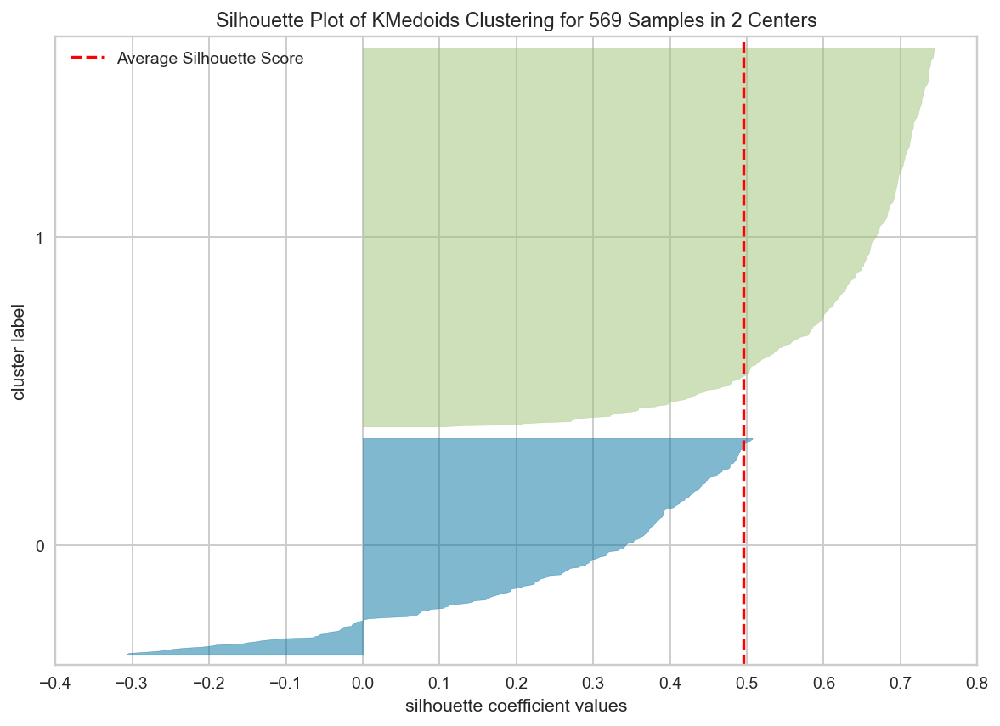

SilhouetteVisualizer(ax=<AxesSubplot:title={'center':'Silhouette Plot of KMedoids Clustering for 569 Samples in 2 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>,
                     colors='yellowbrick', estimator=KMedoids(n_clusters=2))

In [120]:
from yellowbrick.cluster import silhouette_visualizer
plt.figure(figsize=(10,7))
silhouette_visualizer(kmedoids2, pcadata_dropped1, colors='yellowbrick')

Upon reviewing the silhouette values graph, it's evident that certain observations in the blue-colored cluster display negative values, suggesting potential misassignment to the cluster.

In [121]:
silhouette_score(pcadata_dropped1, kmedoids2.labels_)

0.4950317067519501

Mean Silhouette value for this clustering is 0.4950317067521236

In [122]:
clusteringalgorithm = ["kmeans2", "kmeans3", "kmedodis2"]
clusternumber = [2,3,2]
Overlap = ["None", "None", "None"]
NegativeSilhouette = [1,1,1]
AverageSilhouette = [0.50, 0.47, 0.49]

# Calinski-Harabasz

In [124]:
calinski_harabasz_score(pcadata_dropped1, kmedoids2.labels_)


568.8883404313134

# Adjusted Rand Score

In [125]:
adjusted_rand_score(data_df1['Diagnosis'],kmedoids2.labels_)

0.694952603493483

# Accuracy rate

In [126]:
accuracy_score(data_df1['Diagnosis'],kmedoids2.labels_)

0.9173989455184535

# DBSCAN

In [127]:
from sklearn.cluster import DBSCAN
dbscan = DBSCAN(eps = 1.73, min_samples = 20).fit(pcadata_dropped1)

In [128]:
dbscanlabels = dbscan.labels_

In [129]:
set(dbscanlabels)

{-1, 0}

The value of -1 indicates unclustered observations, typically considered as noise. Consequently, only the cluster labeled as 0 remains. In essence, DBSCAN has effectively grouped the data into a single cluster. It seems unnecessary to assess validity indices in this scenario since having one cluster implies the absence of distinct clusters.

# Determination of the optimal Clustering Algorithm

In [131]:
data = {
    "Algorithm": ["kmeans2", "kmeans3", "kmedoids", "ward2", "average3"],
    "K": [2, 3, 2, 2, 3],
    "Overlap": ["None", "None", "None", "Yes", "Yes"],
    "MeanSilhouette": [0.508, 0.476, 0.495, 0.504, 0.529],
    "CalinskiHarabasz": [580.876, 507.561, 568.888, 568.938, 141.525],
    "AdjustedRandIndex": [0.659, 0.533, 0.694, 0.659, 0.058],
    "Accuracyrate": [0.093, 0.093, 0.917, 0.906, 0.333],
    "NegativeSilhouette": [1, 1, 1, 1, 1]
}

# Create a DataFrame
results = pd.DataFrame(data)

# Display the DataFrame
print(results)

  Algorithm  K Overlap  MeanSilhouette  CalinskiHarabasz  AdjustedRandIndex  \
0   kmeans2  2    None           0.508           580.876              0.659   
1   kmeans3  3    None           0.476           507.561              0.533   
2  kmedoids  2    None           0.495           568.888              0.694   
3     ward2  2     Yes           0.504           568.938              0.659   
4  average3  3     Yes           0.529           141.525              0.058   

   Accuracyrate  NegativeSilhouette  
0         0.093                   1  
1         0.093                   1  
2         0.917                   1  
3         0.906                   1  
4         0.333                   1  


# Mean Silhouette

Upon evaluating the Mean Silhouette values for each clustering, it becomes evident that the optimal clustering is achieved with average3 using 2 clusters.

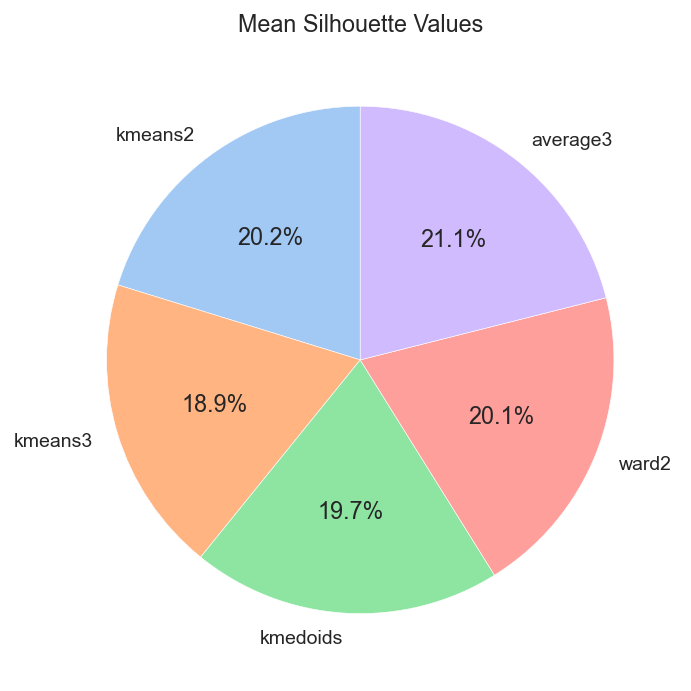

In [141]:
plt.figure(figsize=(6, 6))
plt.pie(results['MeanSilhouette'], labels=results['Algorithm'], autopct='%1.1f%%', colors=sns.color_palette("pastel"), startangle=90)
plt.title('Mean Silhouette Values')
plt.show()

Upon evaluating the Mean Silhouette values for each clustering, it becomes evident that the optimal clustering is achieved with Hierarchical Clustering - Average Linkage using 3 clusters.

# Calinski-Harabasz

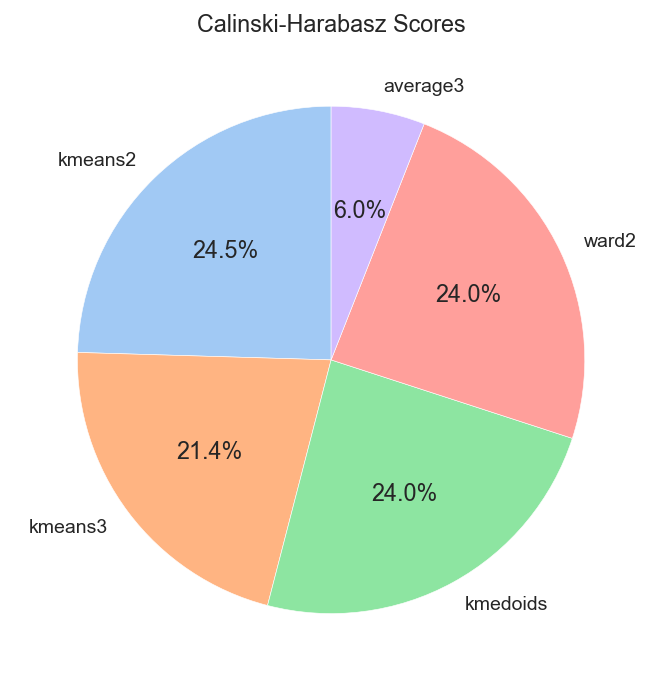

In [140]:
plt.figure(figsize=(6, 6))
plt.pie(results['CalinskiHarabasz'], labels=results['Algorithm'], autopct='%1.1f%%', colors=sns.color_palette("pastel"), startangle=90)
plt.title('Calinski-Harabasz Scores')
plt.show()

Upon evaluating the Calinski-Harabasz values for each clustering, it is evident that the optimal clustering is achieved by employing k-means with 2 clusters.

# Adjusted Rand Index

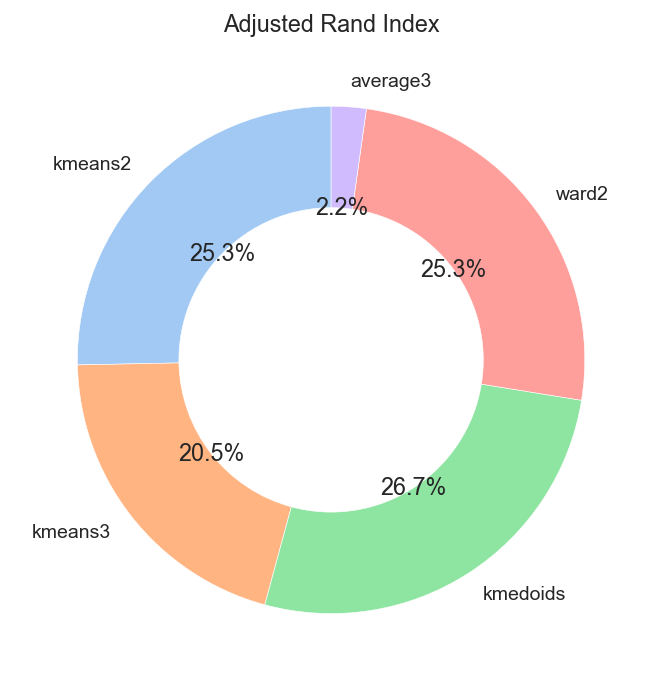

In [139]:
plt.figure(figsize=(6, 6))
plt.pie(results['AdjustedRandIndex'], labels=results['Algorithm'], autopct='%1.1f%%', startangle=90, colors=sns.color_palette("pastel"), wedgeprops=dict(width=0.4))
plt.title('Adjusted Rand Index')
plt.show()

Upon evaluating the Adjusted Rand values for each clustering, it becomes evident that the most favorable clustering is achieved by kmedoids with 2 clusters.

# Accuracy Rate

Text(0.5, 1.0, 'Accuracy Rate')

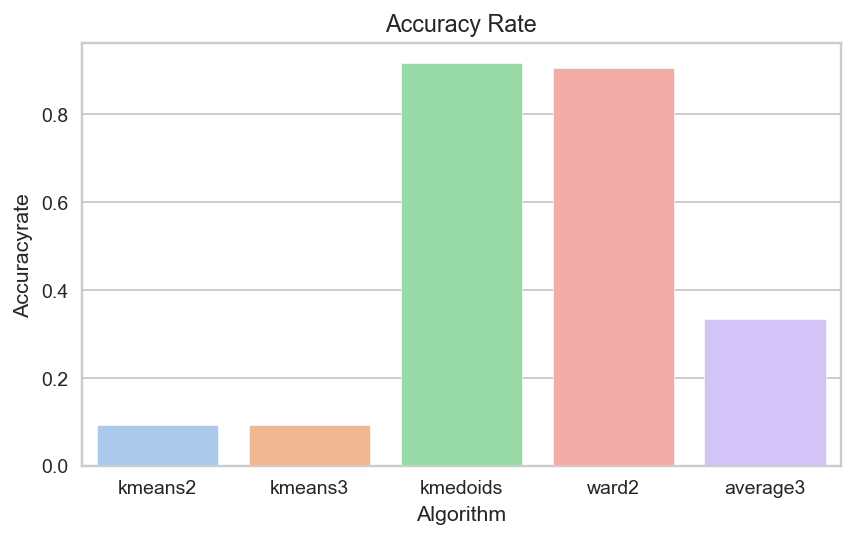

In [148]:
plt.figure(figsize=(7,4))
sns.barplot(data=results, y=results.Accuracyrate, x=results.Algorithm, palette="pastel")
plt.title('Accuracy Rate')

Upon evaluating the accuracy rates for each clustering method, it becomes evident that kmedoids with 2 clusters stands out as the optimal clustering approach.

# Conclusion

After evaluating various algorithms based on metrics for determining the optimal number of clusters for the Wisconsin Breast Cancer (WBC) datasets, 2 appears to be a suitable choice. For this dataset and analysis, where cluster elements are very different from each other and within-cluster differences are also very different, and where ground truth labels are available, it is best to choose an algorithm with the least amount of frequency divergence from the labels. Consequently, K-Medoids emerged as the optimal clustering algorithm with 2 clusters, achieving a commendable clustering accuracy of 91.7% with an 8.3% error rate in clustering the data. It can be considered a highly effective clustering algorithm.

# Clustering Analysis

In [63]:
from sklearn_extra.cluster import KMedoids
kmedoids2 = KMedoids(n_clusters=2)
kmedoids2.fit(pcadata_dropped1)

KMedoids(n_clusters=2)

In [64]:
clusters = pd.DataFrame({"clusters" : kmedoids2.labels_ })

data_dropped1 = pd.concat([data_dropped1,clusters], axis=1)

data_dropped1.head()

,Radius_mean,Texture_mean,Perimeter_mean,Area_mean,Smoothness_mean,Compactness_mean,Concavity_mean,Concave points_mean,Symmetry_mean,Fractal dimension_mean,Radius_se,Tecture_se,Perimeter_se,Area_se,Smoothness_se,Compactness_se,Concavity_se,Concave points_se,Symmetry-se,Fractal dimension_se,Radius_worst,Texture_worst,Perimeter_worst,Area_worst,Smoothness_worst,Compactness_worst,Concavity_worst,Concave points_worst,Symmetry_worst,Fractal_dimension_worst,clusters
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0


In [65]:
data_dropped1.describe().T

,count,mean,std,min,25%,50%,75%,max
Radius_mean,569.0,14.127292,3.524049,6.981000,11.700000,13.370000,15.780000,28.11000
Texture_mean,569.0,19.289649,4.301036,9.710000,16.170000,18.840000,21.800000,39.28000
Perimeter_mean,569.0,91.969033,24.298981,43.790000,75.170000,86.240000,104.100000,188.50000
Area_mean,569.0,654.889104,351.914129,143.500000,420.300000,551.100000,782.700000,2501.00000
Smoothness_mean,569.0,0.096360,0.014064,0.052630,0.086370,0.095870,0.105300,0.16340
Compactness_mean,569.0,0.104341,0.052813,0.019380,0.064920,0.092630,0.130400,0.34540
Concavity_mean,569.0,0.088799,0.079720,0.000000,0.029560,0.061540,0.130700,0.42680
Concave points_mean,569.0,0.048919,0.038803,0.000000,0.020310,0.033500,0.074000,0.20120
Symmetry_mean,569.0,0.181162,0.027414,0.106000,0.161900,0.179200,0.195700,0.30400
Fractal dimension_mean,569.0,0.062798,0.007060,0.049960,0.057700,0.061540,0.066120,0.09744


In [66]:
data_dropped1.groupby("clusters").mean()

,Radius_mean,Texture_mean,Perimeter_mean,Area_mean,Smoothness_mean,Compactness_mean,Concavity_mean,Concave points_mean,Symmetry_mean,Fractal dimension_mean,Radius_se,Tecture_se,Perimeter_se,Area_se,Smoothness_se,Compactness_se,Concavity_se,Concave points_se,Symmetry-se,Fractal dimension_se,Radius_worst,Texture_worst,Perimeter_worst,Area_worst,Smoothness_worst,Compactness_worst,Concavity_worst,Concave points_worst,Symmetry_worst,Fractal_dimension_worst
clusters,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,17.244106,21.173961,114.211836,960.914010,0.104260,0.154980,0.172957,0.090526,0.197182,0.06456,0.618195,1.246730,4.428676,73.098928,0.007185,0.037698,0.050550,0.016412,0.021761,0.004935,20.836329,28.573333,139.889952,1395.958454,0.145580,0.395353,0.477952,0.185198,0.325342,0.094933
1,12.345025,18.212155,79.250083,479.896961,0.091843,0.075384,0.040676,0.025127,0.172001,0.06179,0.283360,1.199769,1.972519,21.603094,0.006959,0.018490,0.021226,0.009157,0.019845,0.003143,13.657594,24.021160,88.603343,585.879558,0.124814,0.173588,0.154528,0.074240,0.269910,0.077663


In [67]:
data_df1.groupby("Diagnosis").mean()

,ID,Radius_mean,Texture_mean,Perimeter_mean,Area_mean,Smoothness_mean,Compactness_mean,Concavity_mean,Concave points_mean,Symmetry_mean,Fractal dimension_mean,Radius_se,Tecture_se,Perimeter_se,Area_se,Smoothness_se,Compactness_se,Concavity_se,Concave points_se,Symmetry-se,Fractal dimension_se,Radius_worst,Texture_worst,Perimeter_worst,Area_worst,Smoothness_worst,Compactness_worst,Concavity_worst,Concave points_worst,Symmetry_worst,Fractal_dimension_worst
Diagnosis,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
B,2.654382e+07,12.146524,17.914762,78.075406,462.790196,0.092478,0.080085,0.046058,0.025717,0.174186,0.062867,0.284082,1.220380,2.000321,21.135148,0.007196,0.021438,0.025997,0.009858,0.020584,0.003636,13.379801,23.515070,87.005938,558.899440,0.124959,0.182673,0.166238,0.074444,0.270246,0.079442
M,3.681805e+07,17.462830,21.604906,115.365377,978.376415,0.102898,0.145188,0.160775,0.087990,0.192909,0.062680,0.609083,1.210915,4.323929,72.672406,0.006780,0.032281,0.041824,0.015060,0.020472,0.004062,21.134811,29.318208,141.370330,1422.286321,0.144845,0.374824,0.450606,0.182237,0.323468,0.091530


Upon examining the descriptive statistics based on the labels B (Benign tumor) and M (Malignant tumor), it is observed that the averages of the observations labeled as 'M' in the variables are higher than the overall average. Given that the cluster with variables above the average in the clustering results is identified as cluster zero, it can be concluded that cluster zero corresponds to malignant tumors, while cluster one corresponds to benign tumors.

# Cluster Visualization

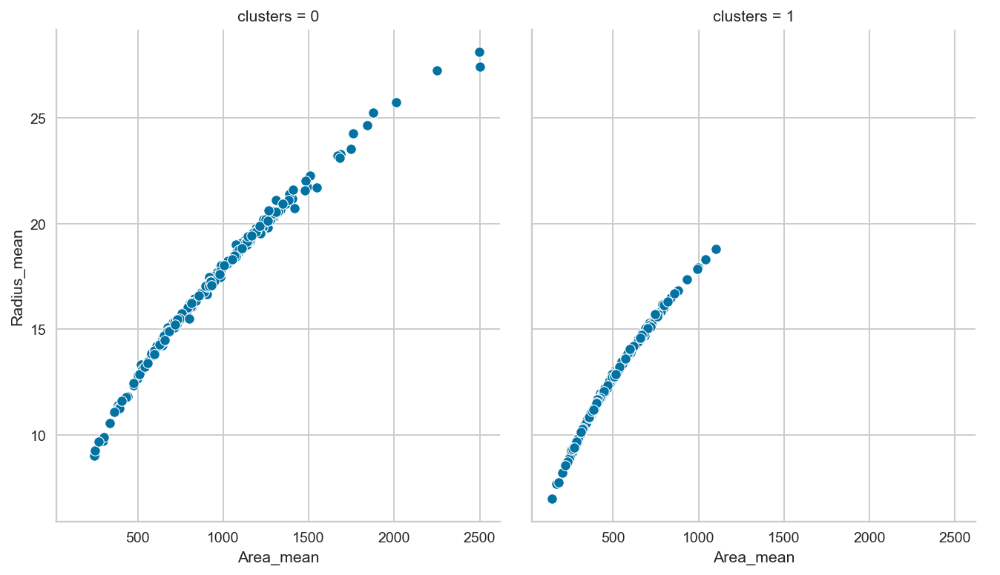

In [68]:
g = sns.FacetGrid(data_dropped1, col="clusters")
g.map(sns.scatterplot, "Area_mean", "Radius_mean")
g.figure.set_size_inches(10,7)
g.add_legend()

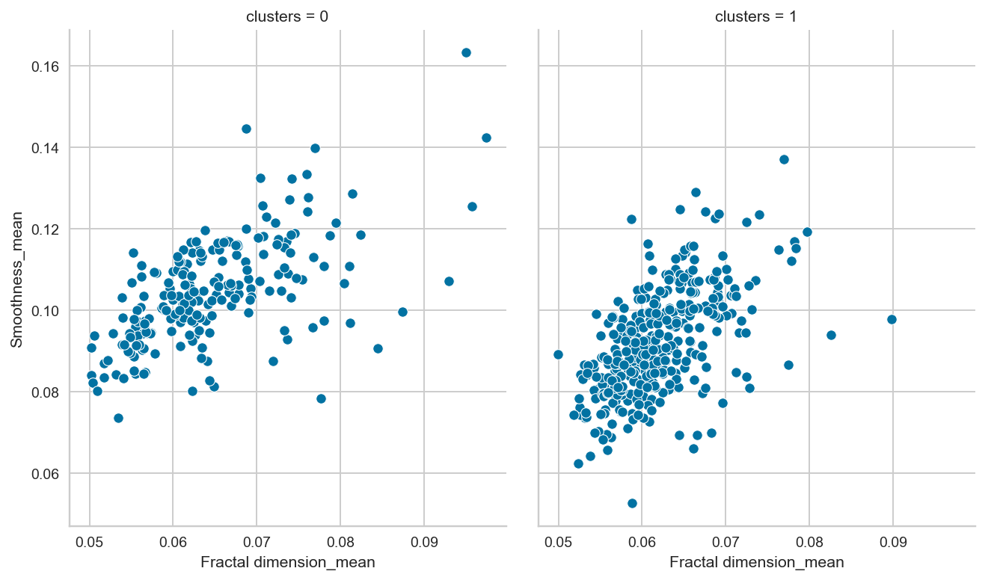

In [69]:
h = sns.FacetGrid(data_dropped1, col="clusters")
h.map(sns.scatterplot, "Fractal dimension_mean", "Smoothness_mean")
h.figure.set_size_inches(10,7)
h.add_legend()

The graph shows a positive correlation for malignant tumors (M) with Radius_mean starting from 8 and Area_mean starting from 25, reaching maximum values for both. In the case of benign tumors (B), a positive relationship is observed in both variables, starting at 0 and ending at 1000 for Area_mean and 17 for Radius_mean. The graph suggests that the areas of malignant tumor nuclei have a broader range, while benign tumor areas do not exhibit significant growth. Additionally, the Radius_mean of benign tumors does not surpass 17.